# PK/PD AL Blood Volume and Hill Equation analyses
# Date: 07/29/2025

## 1. Studying how blood volume affects the hill equation

<br>

In [68]:
import numpy as np
import matplotlib.pyplot as plt

### a. Default PD model
#### ```patient_blood_volume = weight * 70 * 1000```

#### Instantaeneous hourly killing rate ```a```

$$
(\frac{-1}{24}) \times ln({1.0} - \frac{P_{max}\times(\frac{concentration}{blood~volume})^n}{(\frac{concentration}{blood~volume})^n + (\frac{EC_{50}}{blood~volume}^n)})
$$

#### Killing fraction:
$$
\frac{P_{max}\times(\frac{concentration}{blood~volume})^n}{(\frac{concentration}{blood~volume})^n + (\frac{EC_{50}}{blood~volume}^n)}
$$

#### Hourly killing rate:
$$
(\frac{-1}{24}) \times ln({1.0} - killing fraction)
$$

#### Net hourly growth rate:

$g = 0.048$

$ net\,hourly\,growth\,rate = g - \,hourly \,killing \,rate$

In [78]:
# Generate a list of weights

weight_values = list(range(5, 101, 5)) 

print(weight_values)


[5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100]


In [79]:
#Calculate the blood volume for each weight
blood_volume_values = []
blood_volume_values = [weight * 70 for weight in weight_values]
print(blood_volume_values)

[350, 700, 1050, 1400, 1750, 2100, 2450, 2800, 3150, 3500, 3850, 4200, 4550, 4900, 5250, 5600, 5950, 6300, 6650, 7000]


In [80]:
artemether_max_dose = []
lower_limit = 0 # ng
upper_limit = 1000 # ng 
    
# Creating a range of artemether concentrations

for i in range(0, len(weight_values)):
    artemether_max_dose.append(np.linspace(lower_limit, upper_limit, 100))

In [81]:
pmax = 0.99997
ec50_dose = 0.1 * 1000 
n = 1.5

In [83]:
artemether_max_concentrations = []
for i in range(0, len(blood_volume_values)):
    temp_conc = []
    for j in range(0, len(artemether_max_dose[i])): 
        temp_conc.append(artemether_max_dose[i][j] / np.array(blood_volume_values[i]))
        print(f"Weight: {weight_values[i]} kg, Artemether Max Dose: {artemether_max_dose[i][j]} ng, Blood Volume: {blood_volume_values[i]} mL, Artemether Concentration: {temp_conc[j]} ng/mL")
    artemether_max_concentrations.append(temp_conc)

Weight: 5 kg, Artemether Max Dose: 0.0 ng, Blood Volume: 350 mL, Artemether Concentration: 0.0 ng/mL
Weight: 5 kg, Artemether Max Dose: 10.1010101010101 ng, Blood Volume: 350 mL, Artemether Concentration: 0.028860028860028857 ng/mL
Weight: 5 kg, Artemether Max Dose: 20.2020202020202 ng, Blood Volume: 350 mL, Artemether Concentration: 0.05772005772005771 ng/mL
Weight: 5 kg, Artemether Max Dose: 30.3030303030303 ng, Blood Volume: 350 mL, Artemether Concentration: 0.08658008658008658 ng/mL
Weight: 5 kg, Artemether Max Dose: 40.4040404040404 ng, Blood Volume: 350 mL, Artemether Concentration: 0.11544011544011543 ng/mL
Weight: 5 kg, Artemether Max Dose: 50.505050505050505 ng, Blood Volume: 350 mL, Artemether Concentration: 0.1443001443001443 ng/mL
Weight: 5 kg, Artemether Max Dose: 60.6060606060606 ng, Blood Volume: 350 mL, Artemether Concentration: 0.17316017316017315 ng/mL
Weight: 5 kg, Artemether Max Dose: 70.7070707070707 ng, Blood Volume: 350 mL, Artemether Concentration: 0.20202020202

In [84]:
for i in range(0, len(weight_values)):
    for j in range(0, len(artemether_max_concentrations[i])):
        print(f"Weight: {weight_values[i]} kg, Artemether Concentration: {artemether_max_concentrations[i][j]} ng/mL")

Weight: 5 kg, Artemether Concentration: 0.0 ng/mL
Weight: 5 kg, Artemether Concentration: 0.028860028860028857 ng/mL
Weight: 5 kg, Artemether Concentration: 0.05772005772005771 ng/mL
Weight: 5 kg, Artemether Concentration: 0.08658008658008658 ng/mL
Weight: 5 kg, Artemether Concentration: 0.11544011544011543 ng/mL
Weight: 5 kg, Artemether Concentration: 0.1443001443001443 ng/mL
Weight: 5 kg, Artemether Concentration: 0.17316017316017315 ng/mL
Weight: 5 kg, Artemether Concentration: 0.202020202020202 ng/mL
Weight: 5 kg, Artemether Concentration: 0.23088023088023085 ng/mL
Weight: 5 kg, Artemether Concentration: 0.2597402597402597 ng/mL
Weight: 5 kg, Artemether Concentration: 0.2886002886002886 ng/mL
Weight: 5 kg, Artemether Concentration: 0.31746031746031744 ng/mL
Weight: 5 kg, Artemether Concentration: 0.3463203463203463 ng/mL
Weight: 5 kg, Artemether Concentration: 0.3751803751803751 ng/mL
Weight: 5 kg, Artemether Concentration: 0.404040404040404 ng/mL
Weight: 5 kg, Artemether Concentra

In [85]:
ec50_concentrations = []
for i in range(0, len(weight_values)):
    ec50_concentrations.append(ec50_dose / np.array(blood_volume_values[i]))
    print(f"Weight: {weight_values[i]} kg, EC50 Concentration: {ec50_concentrations[i]} ng/mL")

Weight: 5 kg, EC50 Concentration: 0.2857142857142857 ng/mL
Weight: 10 kg, EC50 Concentration: 0.14285714285714285 ng/mL
Weight: 15 kg, EC50 Concentration: 0.09523809523809523 ng/mL
Weight: 20 kg, EC50 Concentration: 0.07142857142857142 ng/mL
Weight: 25 kg, EC50 Concentration: 0.05714285714285714 ng/mL
Weight: 30 kg, EC50 Concentration: 0.047619047619047616 ng/mL
Weight: 35 kg, EC50 Concentration: 0.04081632653061224 ng/mL
Weight: 40 kg, EC50 Concentration: 0.03571428571428571 ng/mL
Weight: 45 kg, EC50 Concentration: 0.031746031746031744 ng/mL
Weight: 50 kg, EC50 Concentration: 0.02857142857142857 ng/mL
Weight: 55 kg, EC50 Concentration: 0.025974025974025976 ng/mL
Weight: 60 kg, EC50 Concentration: 0.023809523809523808 ng/mL
Weight: 65 kg, EC50 Concentration: 0.02197802197802198 ng/mL
Weight: 70 kg, EC50 Concentration: 0.02040816326530612 ng/mL
Weight: 75 kg, EC50 Concentration: 0.01904761904761905 ng/mL
Weight: 80 kg, EC50 Concentration: 0.017857142857142856 ng/mL
Weight: 85 kg, EC50 C

In [86]:
def sigmoid_function(concentration, pmax, ec50, n):
    return (pmax * (concentration ** n)) / ((concentration ** n) + (ec50 ** n))

In [87]:

kill_fraction = []
killing_rates = []

for i in range(0, len(artemether_max_concentrations)):
    temp_kill_fraction = []
    temp_killing_rates = []
    for concentration in artemether_max_concentrations[i]:
        temp_kill_fraction.append(sigmoid_function(concentration, pmax, ec50_concentrations[i], n))
        temp_killing_rates.append((-1/24) * np.log(1.0 - temp_kill_fraction[-1]))
    kill_fraction.append(temp_kill_fraction)
    killing_rates.append(temp_killing_rates)


In [88]:
growth_rate = 0.048 
effect = [] 

for i in range(len(killing_rates)):
    effect.append(growth_rate - np.array(killing_rates[i]))

In [89]:
kill_percent = []
for i in range(len(kill_fraction)):
    temp_kill_percent = []
    for j in range(len(kill_fraction[i])):
        temp_kill_percent.append(kill_fraction[i][j] * 100)
    kill_percent.append(temp_kill_percent)

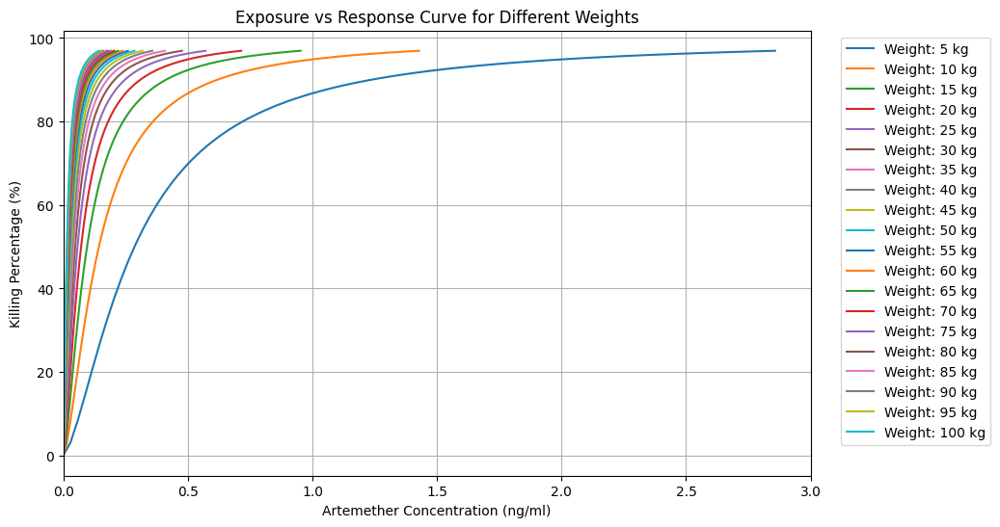

In [90]:
#Plot the exposure vs response curve for all weights
plt.figure(figsize=(10, 6))
for i in range(len(weight_values)):
    plt.plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg')
plt.xlabel('Artemether Concentration (ng/ml)')
plt.xlim(0, 3)
plt.ylabel('Killing Percentage (%)')
plt.title('Exposure vs Response Curve for Different Weights')
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
plt.grid()
plt.show()

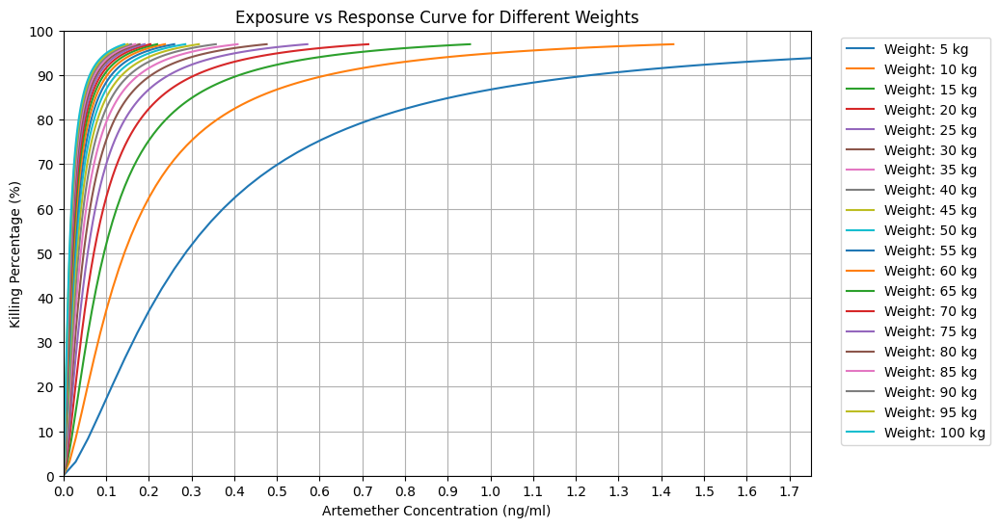

In [91]:
#Plot the exposure vs response curve for all weights
plt.figure(figsize=(10, 6))
for i in range(len(weight_values)):
    plt.plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg')
plt.xlabel('Artemether Concentration (ng/ml)')
plt.xlim(0, 1.75)
plt.xticks(np.arange(0, 1.75, 0.1))
plt.ylim(0, 100)
plt.yticks(np.arange(0, 110, 10))
plt.ylabel('Killing Percentage (%)')
plt.title('Exposure vs Response Curve for Different Weights')
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
plt.grid()
plt.show()

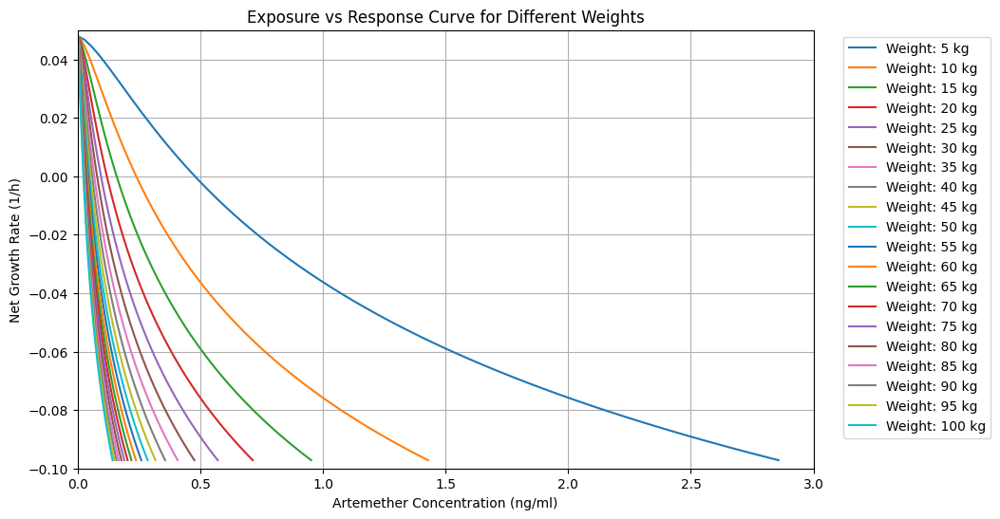

In [101]:
#Plot the exposure vs response curve for all weights
plt.figure(figsize=(10, 6))
for i in range(len(weight_values)):
    plt.plot(artemether_max_concentrations[i], effect[i], label=f'Weight: {weight_values[i]} kg')
plt.xlabel('Artemether Concentration (ng/ml)')
plt.xlim(0, 3)
plt.xticks(np.arange(0, 3.1, 0.5))
plt.ylim(-0.1, 0.05)
plt.ylabel('Net Growth Rate (1/h)')
plt.title('Exposure vs Response Curve for Different Weights')
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
plt.grid()
plt.show()

<br>

# Repeating the same analysis but assuming ec50 is already a concentration

<br>

In [321]:
# Generate a list of weights

weight_values = list(range(5, 101, 5)) 
blood_volume_values = []
blood_volume_values = [weight * 70 for weight in weight_values]
artemether_max_dose = []
lower_limit = 0 # ng
upper_limit = 1000 # ng

# Creating a range of artemether concentrations
for i in range(0, len(weight_values)):
    artemether_max_dose.append(np.linspace(lower_limit, upper_limit, 100))

pmax = 0.99997
ec50_dose = 0.001 * 1000
n = 20
ec50_concentrations = [ec50_dose for weight in weight_values] # Assuming ec50 is already a concentration

In [335]:
for i in range(0, len(weight_values)):
    print(f"Weight: {weight_values[i]} kg, EC50 Concentration: {ec50_concentrations[i]} ng/mL")

Weight: 5 kg, EC50 Concentration: 1.0 ng/mL
Weight: 10 kg, EC50 Concentration: 1.0 ng/mL
Weight: 15 kg, EC50 Concentration: 1.0 ng/mL
Weight: 20 kg, EC50 Concentration: 1.0 ng/mL
Weight: 25 kg, EC50 Concentration: 1.0 ng/mL
Weight: 30 kg, EC50 Concentration: 1.0 ng/mL
Weight: 35 kg, EC50 Concentration: 1.0 ng/mL
Weight: 40 kg, EC50 Concentration: 1.0 ng/mL
Weight: 45 kg, EC50 Concentration: 1.0 ng/mL
Weight: 50 kg, EC50 Concentration: 1.0 ng/mL
Weight: 55 kg, EC50 Concentration: 1.0 ng/mL
Weight: 60 kg, EC50 Concentration: 1.0 ng/mL
Weight: 65 kg, EC50 Concentration: 1.0 ng/mL
Weight: 70 kg, EC50 Concentration: 1.0 ng/mL
Weight: 75 kg, EC50 Concentration: 1.0 ng/mL
Weight: 80 kg, EC50 Concentration: 1.0 ng/mL
Weight: 85 kg, EC50 Concentration: 1.0 ng/mL
Weight: 90 kg, EC50 Concentration: 1.0 ng/mL
Weight: 95 kg, EC50 Concentration: 1.0 ng/mL
Weight: 100 kg, EC50 Concentration: 1.0 ng/mL


In [336]:
artemether_max_concentrations = []
for i in range(0, len(blood_volume_values)):
    temp_conc = []
    for j in range(0, len(artemether_max_dose[i])): 
        temp_conc.append(artemether_max_dose[i][j] / np.array(blood_volume_values[i]))
        print(f"Weight: {weight_values[i]} kg, Artemether Max Dose: {artemether_max_dose[i][j]} ng, Blood Volume: {blood_volume_values[i]} mL, Artemether Concentration: {temp_conc[j]} ng/mL")
    artemether_max_concentrations.append(temp_conc)

Weight: 5 kg, Artemether Max Dose: 0.0 ng, Blood Volume: 350 mL, Artemether Concentration: 0.0 ng/mL
Weight: 5 kg, Artemether Max Dose: 10.1010101010101 ng, Blood Volume: 350 mL, Artemether Concentration: 0.028860028860028857 ng/mL
Weight: 5 kg, Artemether Max Dose: 20.2020202020202 ng, Blood Volume: 350 mL, Artemether Concentration: 0.05772005772005771 ng/mL
Weight: 5 kg, Artemether Max Dose: 30.3030303030303 ng, Blood Volume: 350 mL, Artemether Concentration: 0.08658008658008658 ng/mL
Weight: 5 kg, Artemether Max Dose: 40.4040404040404 ng, Blood Volume: 350 mL, Artemether Concentration: 0.11544011544011543 ng/mL
Weight: 5 kg, Artemether Max Dose: 50.505050505050505 ng, Blood Volume: 350 mL, Artemether Concentration: 0.1443001443001443 ng/mL
Weight: 5 kg, Artemether Max Dose: 60.6060606060606 ng, Blood Volume: 350 mL, Artemether Concentration: 0.17316017316017315 ng/mL
Weight: 5 kg, Artemether Max Dose: 70.7070707070707 ng, Blood Volume: 350 mL, Artemether Concentration: 0.20202020202

/tmp/ipykernel_44985/1211453103.py:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(artemether_max_dose, labels=weight_values)


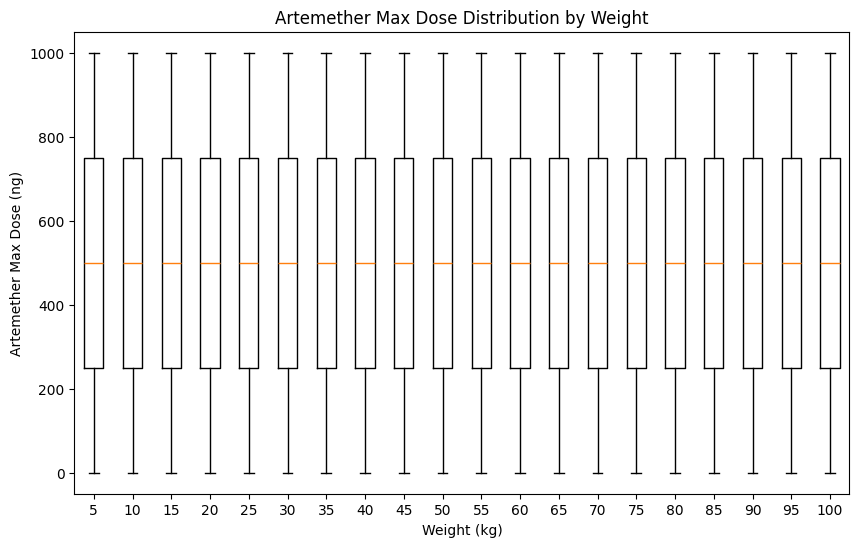

In [350]:
# Plotting the artemther concentrations for all weights as box plots
plt.figure(figsize=(10, 6))
plt.boxplot(artemether_max_dose, labels=weight_values)
plt.xlabel('Weight (kg)')
plt.ylabel('Artemether Max Dose (ng)')
plt.title('Artemether Max Dose Distribution by Weight')
plt.show()

In [352]:
blood_volume_values

[350,
 700,
 1050,
 1400,
 1750,
 2100,
 2450,
 2800,
 3150,
 3500,
 3850,
 4200,
 4550,
 4900,
 5250,
 5600,
 5950,
 6300,
 6650,
 7000]

/tmp/ipykernel_44985/4052138271.py:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(artemether_max_concentrations, labels=weight_values)


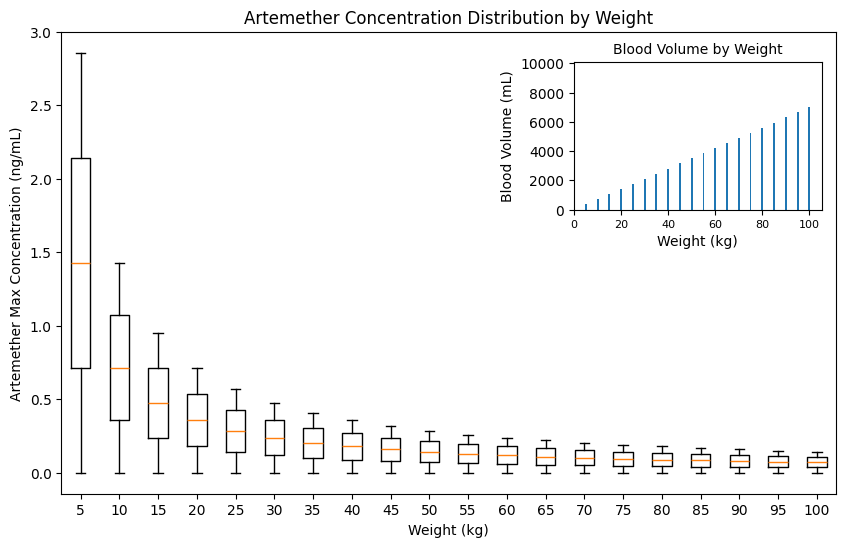

In [428]:
# Plotting the artemther concentrations for all weights as box plots
fig, ax = plt.subplots(figsize=(10, 6))
ax.boxplot(artemether_max_concentrations, labels=weight_values)
ax.set_xlabel('Weight (kg)')
ax.set_ylabel('Artemether Max Concentration (ng/mL)')
ax.set_title('Artemether Concentration Distribution by Weight')


from mpl_toolkits.axes_grid1.inset_locator import inset_axes
inset_ax = inset_axes(parent_axes=ax, width="40%", height="40%", loc='upper right', bbox_to_anchor=(0.19, 0.15, 0.8, 0.8),
                      bbox_transform=ax.transAxes)
inset_ax.bar(weight_values, blood_volume_values)
inset_ax.set_xlabel('Weight (kg)', fontsize=10)
inset_ax.set_xticks(np.arange(0, 101, 20))
inset_ax.set_xticklabels(np.arange(0, 101, 20), fontsize=8)
inset_ax.set_ylim(0, 10100)
inset_ax.set_yticks(np.arange(0, 10100, 2000))
inset_ax.set_ylabel('Blood Volume (mL)', fontsize=10)
inset_ax.set_title('Blood Volume by Weight', fontsize=10)

plt.show()

In [323]:
kill_fraction = []
killing_rates = []

for i in range(0, len(artemether_max_concentrations)):
    temp_kill_fraction = []
    temp_killing_rates = []
    for concentration in artemether_max_concentrations[i]:
        temp_kill_fraction.append(sigmoid_function(concentration, pmax, ec50_concentrations[i], n))
        temp_killing_rates.append((-1/24) * np.log(1.0 - temp_kill_fraction[-1]))
    kill_fraction.append(temp_kill_fraction)
    killing_rates.append(temp_killing_rates)

growth_rate = 0.048 
effect = [] 

for i in range(len(killing_rates)):
    effect.append(growth_rate - np.array(killing_rates[i]))

kill_percent = []
for i in range(len(kill_fraction)):
    temp_kill_percent = []
    for j in range(len(kill_fraction[i])):
        temp_kill_percent.append(kill_fraction[i][j] * 100)
    kill_percent.append(temp_kill_percent)

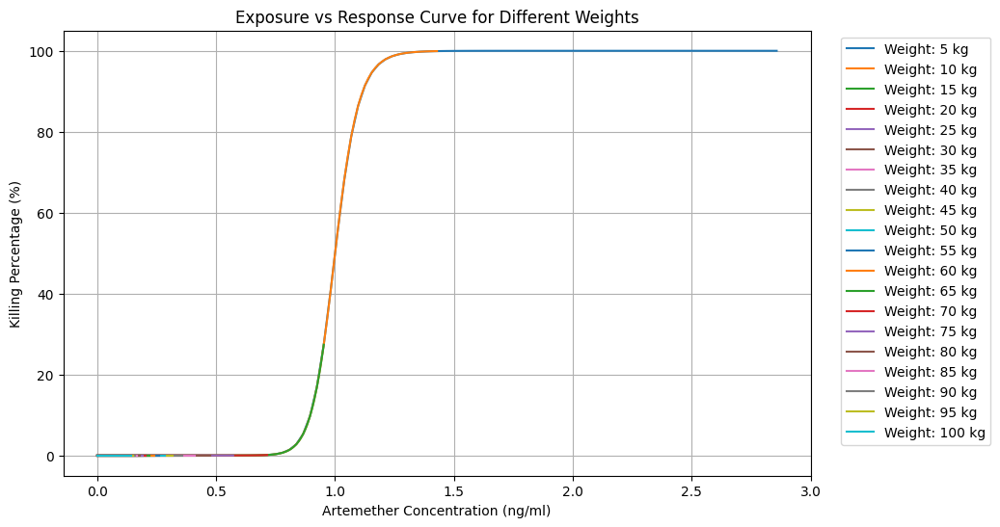

In [324]:
#Plot the exposure vs response curve for all weights
plt.figure(figsize=(10, 6))
for i in range(len(weight_values)):
    plt.plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg')
plt.xlabel('Artemether Concentration (ng/ml)')
plt.ylabel('Killing Percentage (%)')
plt.title('Exposure vs Response Curve for Different Weights')
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
plt.grid()
plt.show()

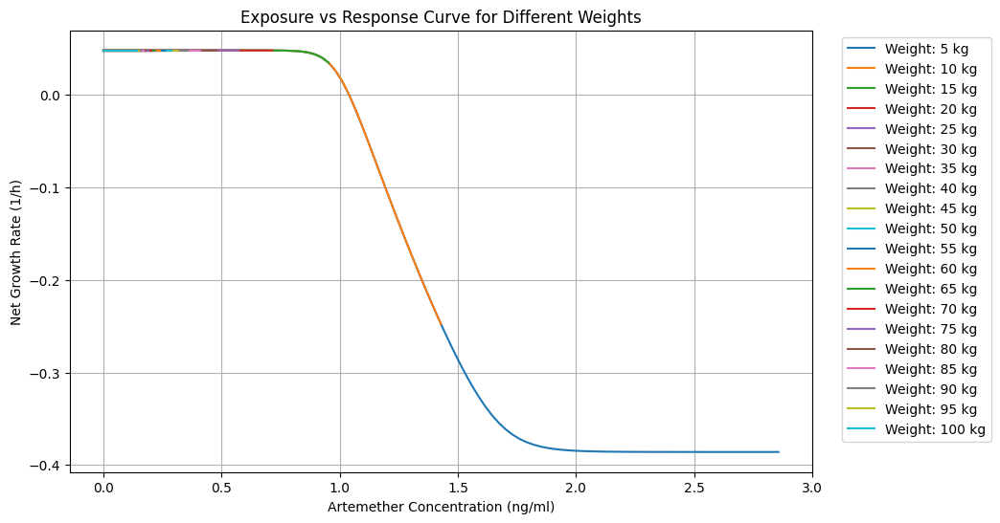

In [325]:
#Plot the exposure vs response curve for all weights
plt.figure(figsize=(10, 6))
for i in range(len(weight_values)):
    plt.plot(artemether_max_concentrations[i], effect[i], label=f'Weight: {weight_values[i]} kg')
plt.xlabel('Artemether Concentration (ng/ml)')
plt.ylabel('Net Growth Rate (1/h)')
plt.title('Exposure vs Response Curve for Different Weights')
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
plt.grid()
plt.show()

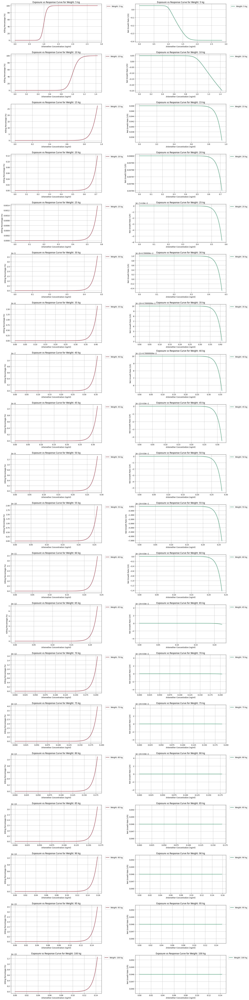

In [326]:
# Creating subplots for each weight 
fig, axs = plt.subplots(len(weight_values), 2, figsize=(20, 4 * len(weight_values)))
for i in range(len(weight_values)):
    axs[i, 0].plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    axs[i, 0].set_xlabel('Artemether Concentration (ng/ml)')
    axs[i, 0].set_ylabel('Killing Percentage (%)')
    axs[i, 0].set_title(f'Exposure vs Response Curve for Weight: {weight_values[i]} kg')
    axs[i, 0].legend(loc='upper right', bbox_to_anchor=(1.25, 1))
    axs[i, 0].grid()

    axs[i, 1].plot(artemether_max_concentrations[i], effect[i], label=f'Weight: {weight_values[i]} kg', color='#048243')
    axs[i, 1].set_xlabel('Artemether Concentration (ng/ml)')
    axs[i, 1].set_ylabel('Net Growth Rate (1/h)')
    axs[i, 1].set_title(f'Exposure vs Response Curve for Weight: {weight_values[i]} kg')
    axs[i, 1].legend(loc='upper right', bbox_to_anchor=(1.25, 1))
    axs[i, 1].grid()
plt.tight_layout()
plt.show()

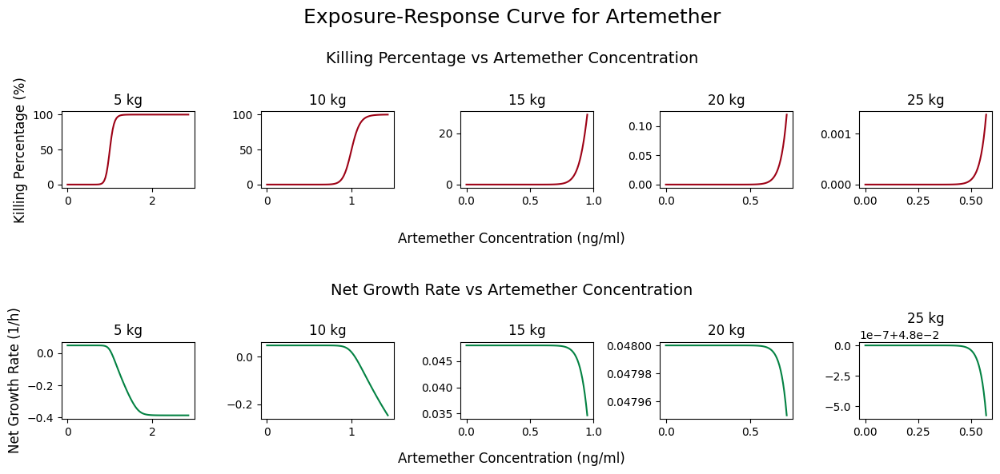

In [327]:
# Creating subplots for each weight 
fig, axs = plt.subplots(2, 5, figsize=(15, 5))
plt.subplots_adjust(hspace=2)
plt.subplots_adjust(wspace=0.5)
for i in range(5):
    axs[0, i].plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    axs[1, i].plot(artemether_max_concentrations[i], effect[i], label=f'Weight: {weight_values[i]} kg', color='#048243')
    axs[1, 0].set_ylabel('Net Growth Rate (1/h)', fontsize=12)
    axs[0, 0].set_ylabel('Killing Percentage (%)', fontsize=12)
    axs[0, i].set_title(f'{weight_values[i]} kg')
    axs[1, i].set_title(f'{weight_values[i]} kg')
    # axs[0, i].grid()
    # axs[1,i].grid()
fig.text(0.5, 0.55, 'Artemether Concentration (ng/ml)', ha='center', fontsize=12)
fig.text(0.5, 0, 'Artemether Concentration (ng/ml)', ha='center', fontsize=12)
fig.text(0.5, 0.42, 'Net Growth Rate vs Artemether Concentration', ha='center', fontsize=14)
fig.text(0.5, 1, 'Killing Percentage vs Artemether Concentration', ha='center', fontsize=14)
fig.text(0.5, 1.1, 'Exposure-Response Curve for Artemether', ha='center', fontsize=18)

plt.show()

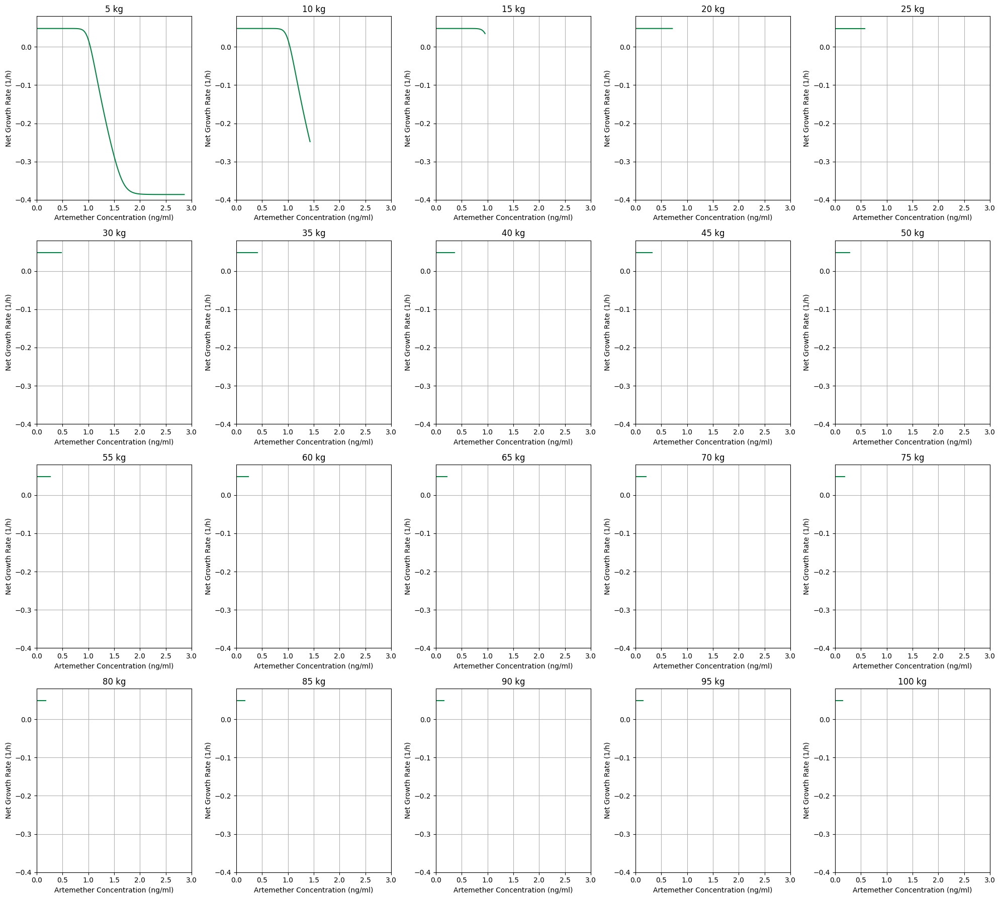

In [328]:
# Creating subplots for each weight for only net growth rate
# 4 x 5 subplots
fig, axs = plt.subplots(4, 5, figsize=(20, 18))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_max_concentrations[i], effect[i], label=f'Weight: {weight_values[i]} kg', color="#048243")
    axs[i // 5, i % 5].set_xlim(0, 3)
    axs[i // 5, i % 5].set_xticks(np.arange(0, 3.1, 0.5))
    axs[i // 5, i % 5].set_ylim(-0.4, 0.08)
    axs[i // 5, i % 5].set_xlabel('Artemether Concentration (ng/ml)')
    axs[i // 5, i % 5].set_ylabel('Net Growth Rate (1/h)')
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg')
    #axs[i // 5, i % 5].legend(loc='upper right', bbox_to_anchor=(1.25, 1))
    axs[i // 5, i % 5].grid()
plt.tight_layout()
plt.show()

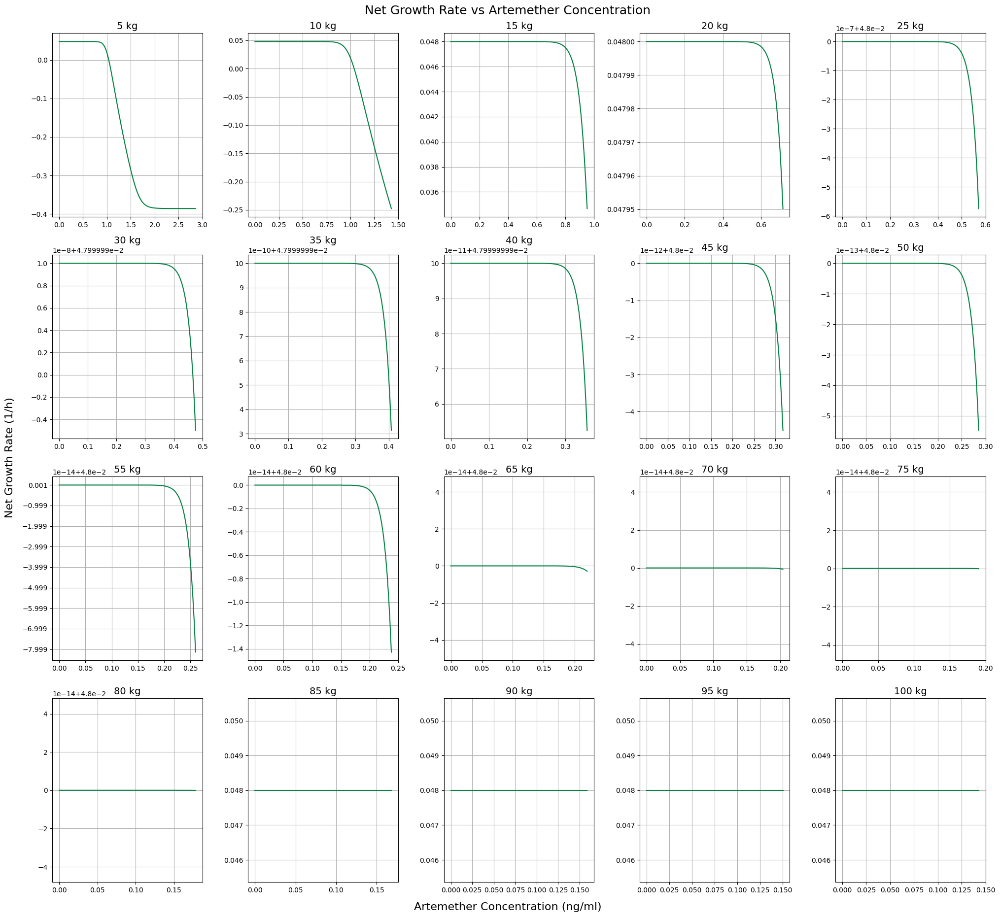

In [330]:
# Creating subplots for each weight for only net growth rate
# 4 x 5 subplots
fig, axs = plt.subplots(4, 5, figsize=(20, 18))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_max_concentrations[i], effect[i], label=f'Weight: {weight_values[i]} kg', color="#048243")
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=14)
    axs[i // 5, i % 5].grid()
    #axs[i // 5, i % 5].legend(loc='upper right', bbox_to_anchor=(1.25, 1))
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=16)
fig.text(-0.01, 0.5, 'Net Growth Rate (1/h)', va='center', rotation='vertical', fontsize=16)
fig.text(0.5, 1.0, 'Net Growth Rate vs Artemether Concentration', ha='center', fontsize=18)
plt.tight_layout()
plt.show()

/tmp/ipykernel_44985/774664563.py:5: RuntimeWarning: divide by zero encountered in log
  axs[i // 5, i % 5].plot(np.log(artemether_max_concentrations[i]), effect[i], label=f'Weight: {weight_values[i]} kg', color='#048243')


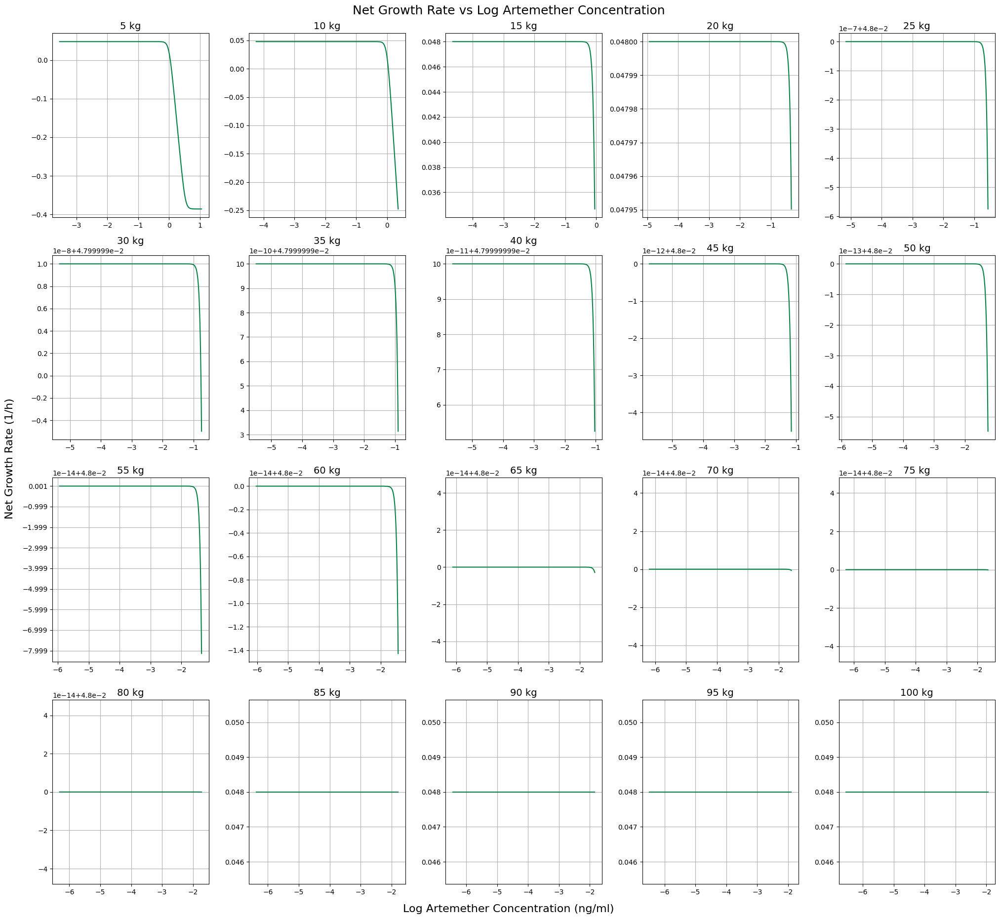

In [331]:
# Creating subplots for each weight for only net growth rate
# 4 x 5 subplots
fig, axs = plt.subplots(4, 5, figsize=(20, 18))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(np.log(artemether_max_concentrations[i]), effect[i], label=f'Weight: {weight_values[i]} kg', color='#048243')
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=14)
    axs[i // 5, i % 5].grid()
    #axs[i // 5, i % 5].legend(loc='upper right', bbox_to_anchor=(1.25, 1))
fig.text(0.5, -0.01, 'Log Artemether Concentration (ng/ml)', ha='center', fontsize=16)
fig.text(-0.01, 0.5, 'Net Growth Rate (1/h)', va='center', rotation='vertical', fontsize=16)
fig.text(0.5, 1.0, 'Net Growth Rate vs Log Artemether Concentration', ha='center', fontsize=18)
plt.tight_layout()
plt.show()

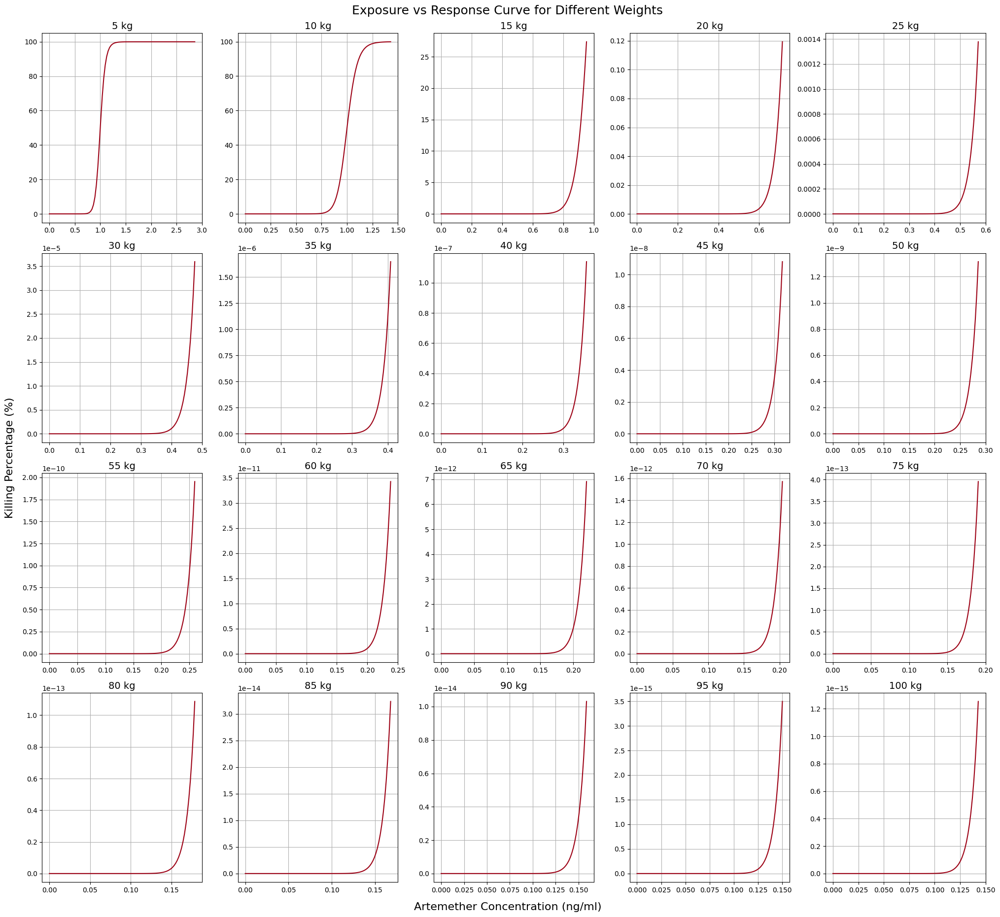

In [332]:
# Creating subplots for each weight for only killing percentage
fig, axs = plt.subplots(4, 5, figsize=(20, 18))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    # axs[i // 5, i % 5].set_xlabel('Artemether Concentration (ng/ml)')
    # axs[i // 5, i % 5].set_ylabel('Killing Percentage (%)')
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=14)
    axs[i // 5, i % 5].grid()
#Setting common labels for the entire figure
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=16)
fig.text(-0.01, 0.5, 'Killing Percentage (%)', va='center', rotation='vertical', fontsize=16)
fig.text(0.5, 1.0, 'Exposure vs Response Curve for Different Weights', ha='center', fontsize=18)
plt.tight_layout()
plt.show()

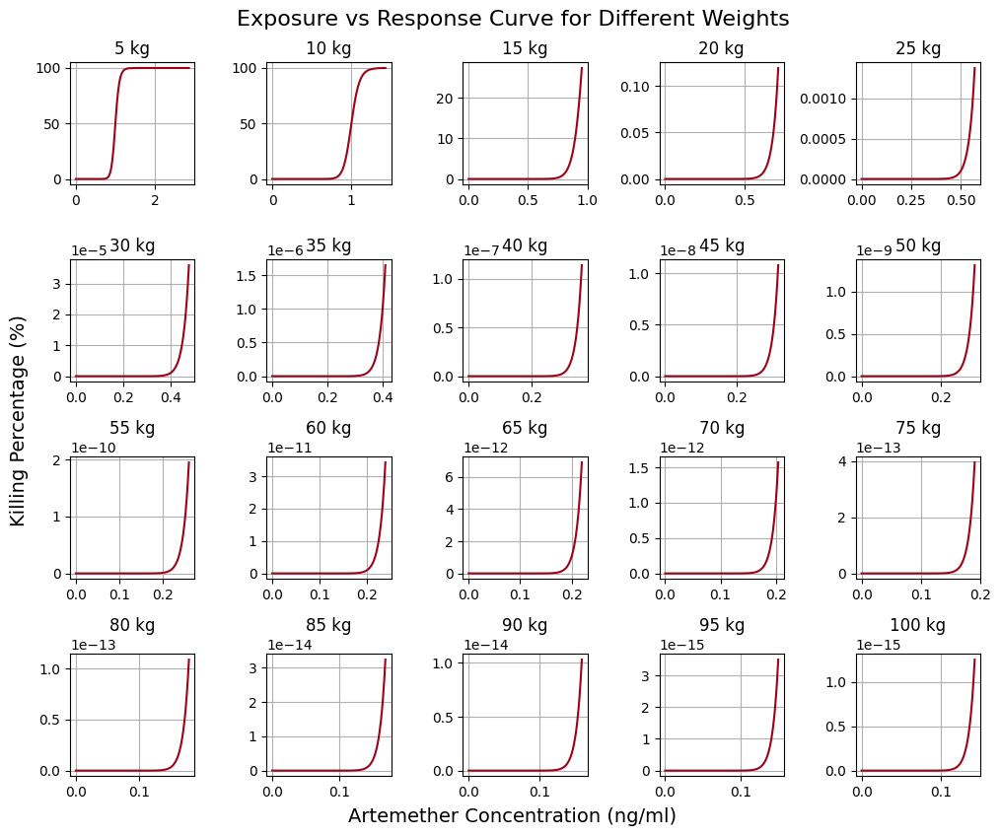

In [333]:
# Creating subplots for each weight for only killing percentage
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    # axs[i // 5, i % 5].set_xlabel('Artemether Concentration (ng/ml)')
    # axs[i // 5, i % 5].set_ylabel('Killing Percentage (%)')
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=12)
    axs[i // 5, i % 5].grid()
#Setting common labels for the entire figure
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=14)
fig.text(-0.01, 0.5, 'Killing Percentage (%)', va='center', rotation='vertical', fontsize=14)
fig.text(0.5, 1.0, 'Exposure vs Response Curve for Different Weights', ha='center', fontsize=16)
plt.tight_layout()
plt.show()

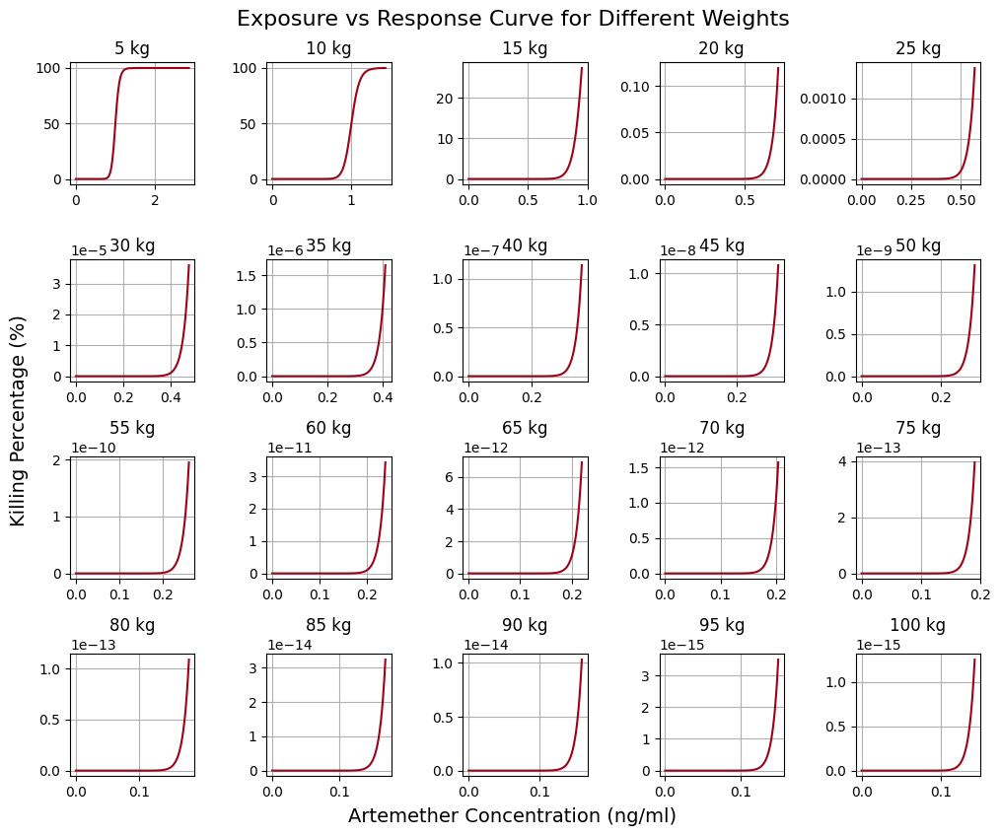

In [334]:
# Creating subplots for each weight for only killing percentage
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    # axs[i // 5, i % 5].set_xlabel('Artemether Concentration (ng/ml)')
    # axs[i // 5, i % 5].set_ylabel('Killing Percentage (%)')
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=12)
    axs[i // 5, i % 5].grid()
#Setting common labels for the entire figure
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=14)
fig.text(-0.01, 0.5, 'Killing Percentage (%)', va='center', rotation='vertical', fontsize=14)
fig.text(0.5, 1.0, 'Exposure vs Response Curve for Different Weights', ha='center', fontsize=16)
plt.tight_layout()
plt.show()

<br>
<br>

# a) EC50 is already a concentration (in ng/ml) and changing blood volume calculation
## To make sure that the artemether concentrations are similar across weights despite increasing blood volume

In [430]:
# Generate a list of weights

weight_values = list(range(5, 101, 5)) 
artemether_max_dose = []
lower_limit = 0 # ng
upper_limit = 1000 # ng

# Creating a range of artemether concentrations
for i in range(0, len(weight_values)):
    artemether_max_dose.append(np.linspace(lower_limit, upper_limit, 100))

pmax = 0.99997
ec50_dose = 0.001 * 1000
n = 20
ec50_concentrations = [ec50_dose for weight in weight_values] # Assuming ec50 is already a concentration

In [452]:
0.001 * 1000

1.0

#### Calculating BV using the Lemmens-Bernstein-Brodsky Equation

$$
BV = \frac{70}{\sqrt{\frac{BMI}{22}}}
$$

In [443]:
blood_volume_values = []

bmi_ideal_body_weight = 22 #kg/m**2
blood_volume_ideal_body_weight = 70 # mL/kg

for weight in weight_values:
    volume = weight * (blood_volume_ideal_body_weight / np.sqrt(18.5/bmi_ideal_body_weight))
    blood_volume_values.append(volume)
    print(f"Weight: {weight} kg, Blood Volume: {volume} mL")

Weight: 5 kg, Blood Volume: 381.6748297643895 mL
Weight: 10 kg, Blood Volume: 763.349659528779 mL
Weight: 15 kg, Blood Volume: 1145.0244892931685 mL
Weight: 20 kg, Blood Volume: 1526.699319057558 mL
Weight: 25 kg, Blood Volume: 1908.3741488219473 mL
Weight: 30 kg, Blood Volume: 2290.048978586337 mL
Weight: 35 kg, Blood Volume: 2671.7238083507264 mL
Weight: 40 kg, Blood Volume: 3053.398638115116 mL
Weight: 45 kg, Blood Volume: 3435.073467879505 mL
Weight: 50 kg, Blood Volume: 3816.7482976438946 mL
Weight: 55 kg, Blood Volume: 4198.423127408284 mL
Weight: 60 kg, Blood Volume: 4580.097957172674 mL
Weight: 65 kg, Blood Volume: 4961.772786937063 mL
Weight: 70 kg, Blood Volume: 5343.447616701453 mL
Weight: 75 kg, Blood Volume: 5725.122446465842 mL
Weight: 80 kg, Blood Volume: 6106.797276230232 mL
Weight: 85 kg, Blood Volume: 6488.472105994621 mL
Weight: 90 kg, Blood Volume: 6870.14693575901 mL
Weight: 95 kg, Blood Volume: 7251.8217655234 mL
Weight: 100 kg, Blood Volume: 7633.496595287789 mL


In [444]:
artemether_max_concentrations = []
for i in range(0, len(blood_volume_values)):
    temp_conc = []
    for j in range(0, len(artemether_max_dose[i])): 
        temp_conc.append(artemether_max_dose[i][j] / np.array(blood_volume_values[i]))
        print(f"Weight: {weight_values[i]} kg, Artemether Max Dose: {artemether_max_dose[i][j]} ng, Blood Volume: {blood_volume_values[i]} mL, Artemether Concentration: {temp_conc[j]} ng/mL")
    artemether_max_concentrations.append(temp_conc)

Weight: 5 kg, Artemether Max Dose: 0.0 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 0.0 ng/mL
Weight: 5 kg, Artemether Max Dose: 10.1010101010101 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 0.0264649626155477 ng/mL
Weight: 5 kg, Artemether Max Dose: 20.2020202020202 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 0.0529299252310954 ng/mL
Weight: 5 kg, Artemether Max Dose: 30.3030303030303 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 0.0793948878466431 ng/mL
Weight: 5 kg, Artemether Max Dose: 40.4040404040404 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 0.1058598504621908 ng/mL
Weight: 5 kg, Artemether Max Dose: 50.505050505050505 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 0.13232481307773852 ng/mL
Weight: 5 kg, Artemether Max Dose: 60.6060606060606 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 0.1587897756932862 ng/mL
Weight: 5 kg, Artemether

/tmp/ipykernel_44985/649405258.py:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(artemether_max_concentrations, labels=weight_values)


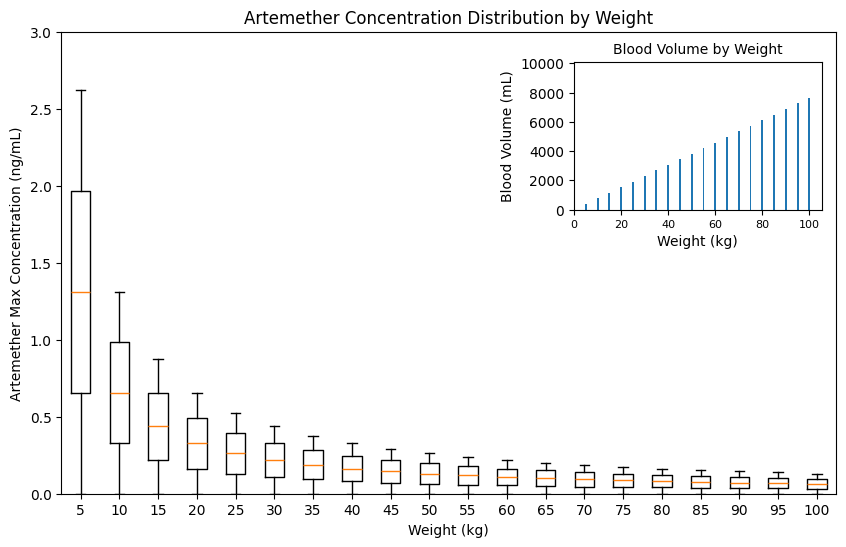

In [485]:
# Plotting the artemther concentrations for all weights as box plots
fig, ax = plt.subplots(figsize=(10, 6))
ax.boxplot(artemether_max_concentrations, labels=weight_values)
ax.set_xlabel('Weight (kg)')
ax.set_ylim(0, 3)
ax.set_ylabel('Artemether Max Concentration (ng/mL)')
ax.set_title('Artemether Concentration Distribution by Weight')


from mpl_toolkits.axes_grid1.inset_locator import inset_axes
inset_ax = inset_axes(parent_axes=ax, width="40%", height="40%", loc='upper right', bbox_to_anchor=(0.19, 0.15, 0.8, 0.8),
                      bbox_transform=ax.transAxes)
inset_ax.bar(weight_values, blood_volume_values)
inset_ax.set_xlabel('Weight (kg)', fontsize=10)
inset_ax.set_xticks(np.arange(0, 101, 20))
inset_ax.set_xticklabels(np.arange(0, 101, 20), fontsize=8)
inset_ax.set_ylim(0, 10100)
inset_ax.set_yticks(np.arange(0, 10100, 2000))
inset_ax.set_ylabel('Blood Volume (mL)', fontsize=10)
inset_ax.set_title('Blood Volume by Weight', fontsize=10)

plt.show()

In [446]:
kill_fraction = []
killing_rates = []

for i in range(0, len(artemether_max_concentrations)):
    temp_kill_fraction = []
    temp_killing_rates = []
    for concentration in artemether_max_concentrations[i]:
        temp_kill_fraction.append(sigmoid_function(concentration, pmax, ec50_concentrations[i], n))
        temp_killing_rates.append((-1/24) * np.log(1.0 - temp_kill_fraction[-1]))
    kill_fraction.append(temp_kill_fraction)
    killing_rates.append(temp_killing_rates)

growth_rate = 0.048 
effect = [] 

for i in range(len(killing_rates)):
    effect.append(growth_rate - np.array(killing_rates[i]))

kill_percent = []
for i in range(len(kill_fraction)):
    temp_kill_percent = []
    for j in range(len(kill_fraction[i])):
        temp_kill_percent.append(kill_fraction[i][j] * 100)
    kill_percent.append(temp_kill_percent)

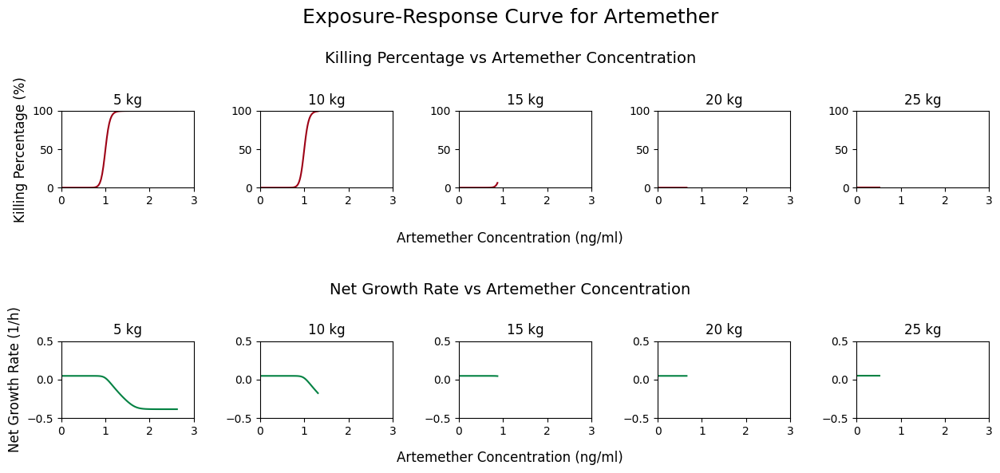

In [483]:
# Creating subplots for each weight 
fig, axs = plt.subplots(2, 5, figsize=(15, 5))
plt.subplots_adjust(hspace=2)
plt.subplots_adjust(wspace=0.5)
for i in range(5):
    axs[0, i].plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    axs[1, i].plot(artemether_max_concentrations[i], effect[i], label=f'Weight: {weight_values[i]} kg', color='#048243')
    axs[0, i].set_xlim(0, 3)
    axs[0, i].set_ylim(0, 100)
    axs[1, 0].set_ylabel('Net Growth Rate (1/h)', fontsize=12)
    axs[0, 0].set_ylabel('Killing Percentage (%)', fontsize=12)
    axs[0, i].set_title(f'{weight_values[i]} kg')
    axs[1, i].set_title(f'{weight_values[i]} kg')
    axs[1, i].set_xlim(0, 3)
    axs[1, i].set_ylim(-0.5, 0.5)
    # axs[0, i].grid()
    # axs[1,i].grid()
fig.text(0.5, 0.55, 'Artemether Concentration (ng/ml)', ha='center', fontsize=12)
fig.text(0.5, 0, 'Artemether Concentration (ng/ml)', ha='center', fontsize=12)
fig.text(0.5, 0.42, 'Net Growth Rate vs Artemether Concentration', ha='center', fontsize=14)
fig.text(0.5, 1, 'Killing Percentage vs Artemether Concentration', ha='center', fontsize=14)
fig.text(0.5, 1.1, 'Exposure-Response Curve for Artemether', ha='center', fontsize=18)

plt.show()

In [463]:
for i in range(5,10):
    print(i-5)
    print(weight_values[i])

0
30
1
35
2
40
3
45
4
50


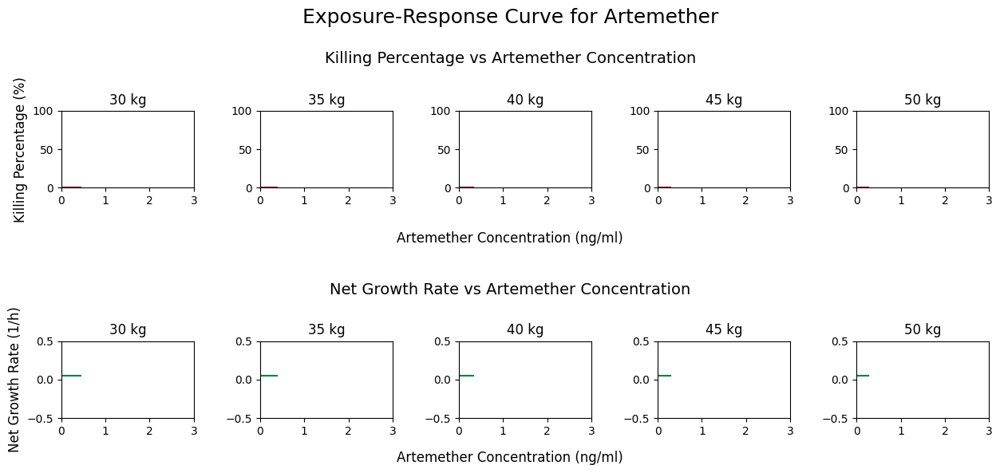

In [481]:
# Creating subplots for each weight 
fig, axs = plt.subplots(2, 5, figsize=(15, 5))
plt.subplots_adjust(hspace=2)
plt.subplots_adjust(wspace=0.5)
for i in range(5,10):
    axs[0, i-5].plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    axs[1, i-5].plot(artemether_max_concentrations[i], effect[i], label=f'Weight: {weight_values[i]} kg', color='#048243')
    axs[1, 0].set_ylabel('Net Growth Rate (1/h)', fontsize=12)
    axs[0, i-5].set_xlim(0, 3)
    axs[0, i-5].set_ylim(0, 100)
    axs[0, 0].set_ylabel('Killing Percentage (%)', fontsize=12)
    axs[0, i-5].set_title(f'{weight_values[i]} kg')
    axs[1, i-5].set_title(f'{weight_values[i]} kg')
    axs[1, i-5].set_xlim(0, 3)
    axs[1, i-5].set_ylim(-0.5, 0.5)
    # axs[0, i].grid()
    # axs[1,i].grid()
fig.text(0.5, 0.55, 'Artemether Concentration (ng/ml)', ha='center', fontsize=12)
fig.text(0.5, 0, 'Artemether Concentration (ng/ml)', ha='center', fontsize=12)
fig.text(0.5, 0.42, 'Net Growth Rate vs Artemether Concentration', ha='center', fontsize=14)
fig.text(0.5, 1, 'Killing Percentage vs Artemether Concentration', ha='center', fontsize=14)
fig.text(0.5, 1.1, 'Exposure-Response Curve for Artemether', ha='center', fontsize=18)

plt.show()

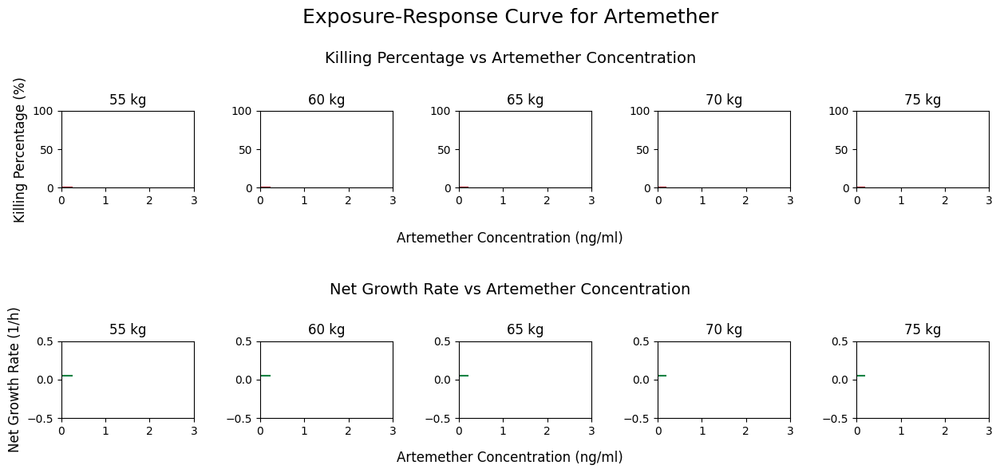

In [482]:
# Creating subplots for each weight 
fig, axs = plt.subplots(2, 5, figsize=(15, 5))
plt.subplots_adjust(hspace=2)
plt.subplots_adjust(wspace=0.5)
for i in range(10,15):
    axs[0, i-10].plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    axs[1, i-10].plot(artemether_max_concentrations[i], effect[i], label=f'Weight: {weight_values[i]} kg', color='#048243')
    axs[0, i-10].set_xlim(0, 3)
    axs[0, i-10].set_ylim(0, 100)
    axs[1, 0].set_ylabel('Net Growth Rate (1/h)', fontsize=12)
    axs[0, 0].set_ylabel('Killing Percentage (%)', fontsize=12)
    axs[0, i-10].set_title(f'{weight_values[i]} kg')
    axs[1, i-10].set_title(f'{weight_values[i]} kg')
    axs[1, i-10].set_xlim(0, 3)
    axs[1, i-10].set_ylim(-0.5, 0.5)
    # axs[0, i].grid()
    # axs[1,i].grid()
fig.text(0.5, 0.55, 'Artemether Concentration (ng/ml)', ha='center', fontsize=12)
fig.text(0.5, 0, 'Artemether Concentration (ng/ml)', ha='center', fontsize=12)
fig.text(0.5, 0.42, 'Net Growth Rate vs Artemether Concentration', ha='center', fontsize=14)
fig.text(0.5, 1, 'Killing Percentage vs Artemether Concentration', ha='center', fontsize=14)
fig.text(0.5, 1.1, 'Exposure-Response Curve for Artemether', ha='center', fontsize=18)

plt.show()

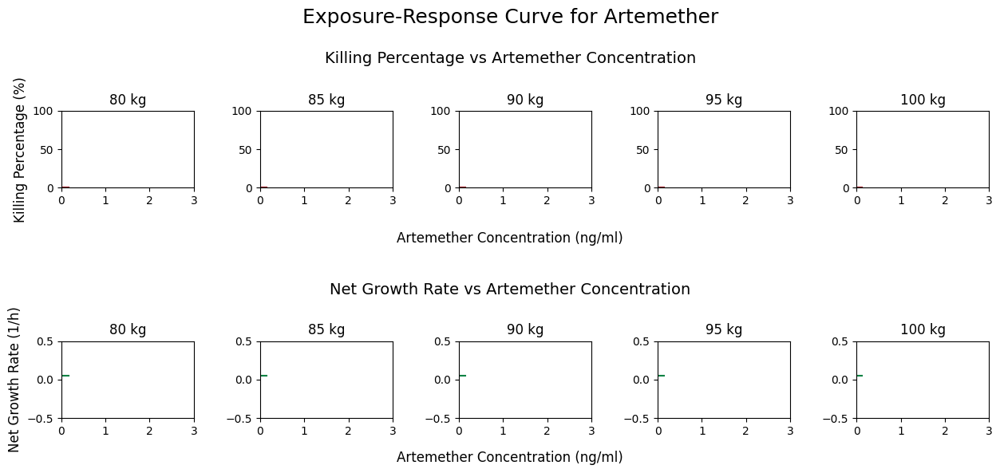

In [474]:
# Creating subplots for each weight 
fig, axs = plt.subplots(2, 5, figsize=(15, 5))
plt.subplots_adjust(hspace=2)
plt.subplots_adjust(wspace=0.5)
for i in range(15,20):
    axs[0, i-15].plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    axs[1, i-15].plot(artemether_max_concentrations[i], effect[i], label=f'Weight: {weight_values[i]} kg', color='#048243')
    axs[0, i-15].set_xlim(0, 3)
    axs[0, i-15].set_ylim(0, 100)
    axs[1, 0].set_ylabel('Net Growth Rate (1/h)', fontsize=12)
    axs[0, 0].set_ylabel('Killing Percentage (%)', fontsize=12)
    axs[0, i-15].set_title(f'{weight_values[i]} kg')
    axs[1, i-15].set_title(f'{weight_values[i]} kg')
    axs[1, i-15].set_xlim(0, 3)
    axs[1, i-15].set_ylim(-0.5, 0.5)
    # axs[0, i].grid()
    # axs[1,i].grid()
fig.text(0.5, 0.55, 'Artemether Concentration (ng/ml)', ha='center', fontsize=12)
fig.text(0.5, 0, 'Artemether Concentration (ng/ml)', ha='center', fontsize=12)
fig.text(0.5, 0.42, 'Net Growth Rate vs Artemether Concentration', ha='center', fontsize=14)
fig.text(0.5, 1, 'Killing Percentage vs Artemether Concentration', ha='center', fontsize=14)
fig.text(0.5, 1.1, 'Exposure-Response Curve for Artemether', ha='center', fontsize=18)

plt.show()

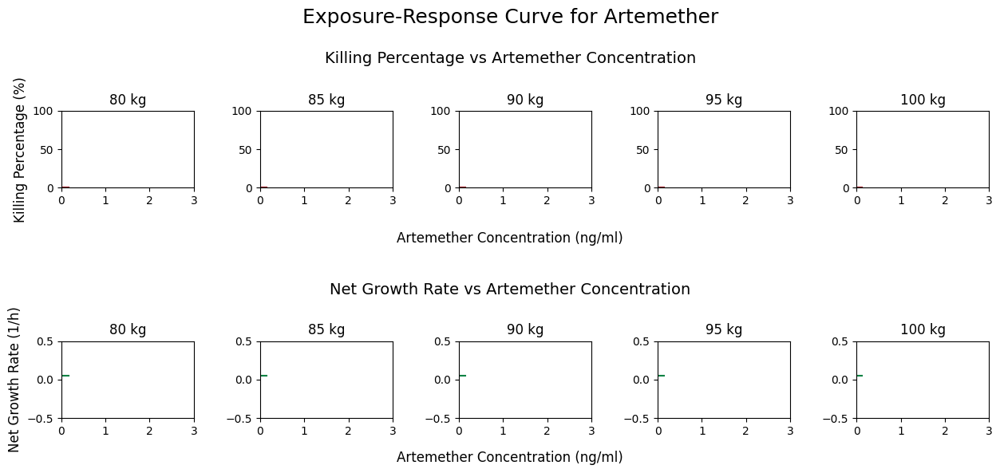

In [472]:
# Creating subplots for each weight 
fig, axs = plt.subplots(2, 5, figsize=(15, 5))
plt.subplots_adjust(hspace=2)
plt.subplots_adjust(wspace=0.5)
for i in range(15,20):
    axs[0, i-15].plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    axs[0, i-15].set_xlim(0, 3)
    axs[0, i-15].set_ylim(0, 100)
    axs[1, i-15].plot(artemether_max_concentrations[i], effect[i], label=f'Weight: {weight_values[i]} kg', color='#048243')
    axs[1, i-15].set_xlim(0, 3)
    axs[1, i-15].set_ylim(-0.5, 0.5)
    axs[1, 0].set_ylabel('Net Growth Rate (1/h)', fontsize=12)
    axs[0, 0].set_ylabel('Killing Percentage (%)', fontsize=12)
    axs[0, i-15].set_title(f'{weight_values[i]} kg')
    axs[1, i-15].set_title(f'{weight_values[i]} kg')
    # axs[0, i].grid()
    # axs[1,i].grid()
fig.text(0.5, 0.55, 'Artemether Concentration (ng/ml)', ha='center', fontsize=12)
fig.text(0.5, 0, 'Artemether Concentration (ng/ml)', ha='center', fontsize=12)
fig.text(0.5, 0.42, 'Net Growth Rate vs Artemether Concentration', ha='center', fontsize=14)
fig.text(0.5, 1, 'Killing Percentage vs Artemether Concentration', ha='center', fontsize=14)
fig.text(0.5, 1.1, 'Exposure-Response Curve for Artemether', ha='center', fontsize=18)

plt.show()

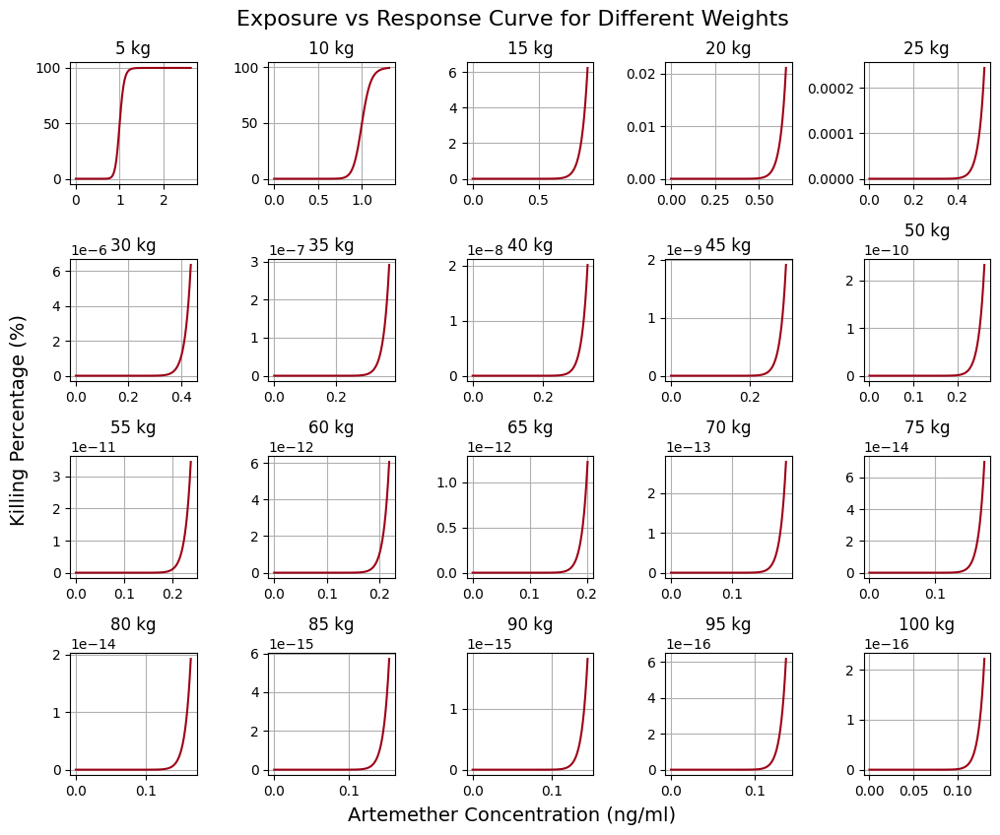

In [448]:
# Creating subplots for each weight for only killing percentage
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    # axs[i // 5, i % 5].set_xlabel('Artemether Concentration (ng/ml)')
    # axs[i // 5, i % 5].set_ylabel('Killing Percentage (%)')
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=12)
    axs[i // 5, i % 5].grid()
#Setting common labels for the entire figure
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=14)
fig.text(-0.01, 0.5, 'Killing Percentage (%)', va='center', rotation='vertical', fontsize=14)
fig.text(0.5, 1.0, 'Exposure vs Response Curve for Different Weights', ha='center', fontsize=16)
plt.tight_layout()
plt.show()

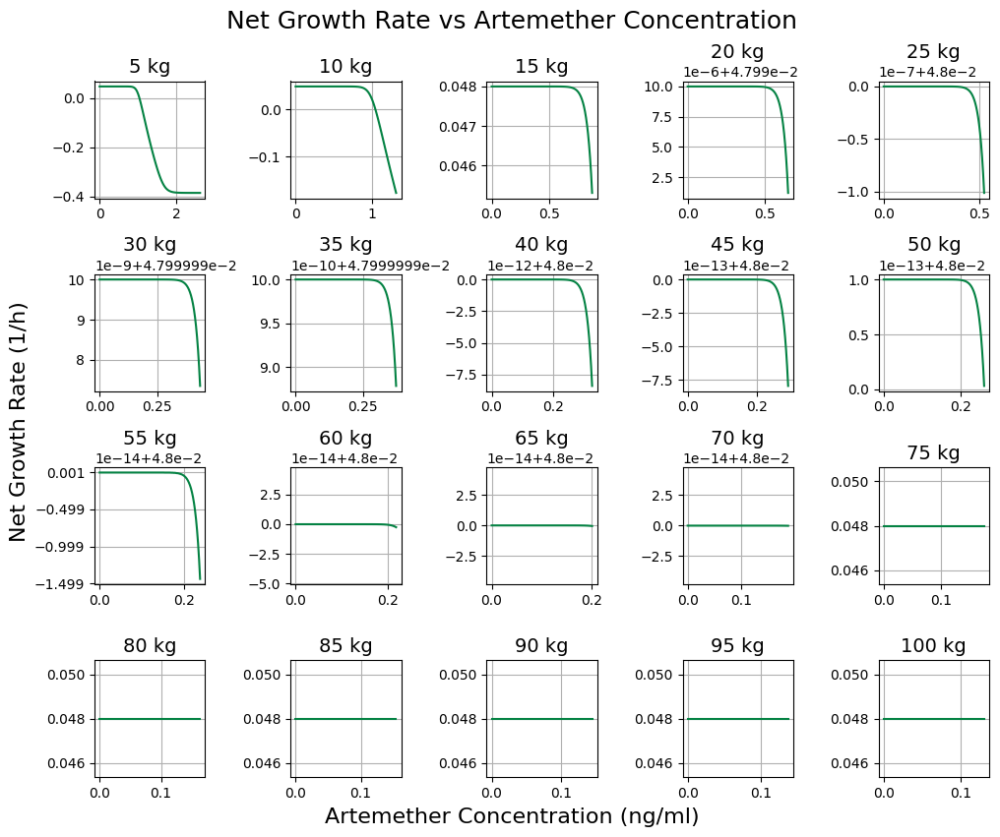

In [451]:
# Creating subplots for each weight for only net growth rate
# 4 x 5 subplots
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_max_concentrations[i], effect[i], label=f'Weight: {weight_values[i]} kg', color="#048243")
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=14)
    axs[i // 5, i % 5].grid()
    #axs[i // 5, i % 5].legend(loc='upper right', bbox_to_anchor=(1.25, 1))
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=16)
fig.text(-0.01, 0.5, 'Net Growth Rate (1/h)', va='center', rotation='vertical', fontsize=16)
fig.text(0.5, 1.0, 'Net Growth Rate vs Artemether Concentration', ha='center', fontsize=18)
plt.tight_layout()
plt.show()

# Time to go ham and mess with all kind of blood volume calculations to make the concentrations similar across weights

#### Let's try first try changing the concentration range for artemether

In [ ]:
weight_values = list(range(5, 101, 5)) 
artemether_max_dose = []
lower_limit = 0 # ng
upper_limit = 100000 # ng

# Creating a range of artemether concentrations
for i in range(0, len(weight_values)):
    artemether_max_dose.append(np.linspace(lower_limit, upper_limit, 1000))

pmax = 0.99997
ec50_dose = 0.01 * 1000
n = 20
ec50_concentrations = [ec50_dose for weight in weight_values] # Assuming ec50 is already a concentration

In [564]:
ec50_dose

10.0

In [546]:
blood_volume_values = []

bmi_ideal_body_weight = 22 #kg/m**2
blood_volume_ideal_body_weight = 70 # mL/kg

for weight in weight_values:
    volume = weight * (blood_volume_ideal_body_weight / np.sqrt(18.5/bmi_ideal_body_weight))
    blood_volume_values.append(volume)
    print(f"Weight: {weight} kg, Blood Volume: {volume} mL")

Weight: 5 kg, Blood Volume: 381.6748297643895 mL
Weight: 10 kg, Blood Volume: 763.349659528779 mL
Weight: 15 kg, Blood Volume: 1145.0244892931685 mL
Weight: 20 kg, Blood Volume: 1526.699319057558 mL
Weight: 25 kg, Blood Volume: 1908.3741488219473 mL
Weight: 30 kg, Blood Volume: 2290.048978586337 mL
Weight: 35 kg, Blood Volume: 2671.7238083507264 mL
Weight: 40 kg, Blood Volume: 3053.398638115116 mL
Weight: 45 kg, Blood Volume: 3435.073467879505 mL
Weight: 50 kg, Blood Volume: 3816.7482976438946 mL
Weight: 55 kg, Blood Volume: 4198.423127408284 mL
Weight: 60 kg, Blood Volume: 4580.097957172674 mL
Weight: 65 kg, Blood Volume: 4961.772786937063 mL
Weight: 70 kg, Blood Volume: 5343.447616701453 mL
Weight: 75 kg, Blood Volume: 5725.122446465842 mL
Weight: 80 kg, Blood Volume: 6106.797276230232 mL
Weight: 85 kg, Blood Volume: 6488.472105994621 mL
Weight: 90 kg, Blood Volume: 6870.14693575901 mL
Weight: 95 kg, Blood Volume: 7251.8217655234 mL
Weight: 100 kg, Blood Volume: 7633.496595287789 mL


In [547]:
artemether_max_concentrations = []
for i in range(0, len(blood_volume_values)):
    temp_conc = []
    for j in range(0, len(artemether_max_dose[i])): 
        temp_conc.append(artemether_max_dose[i][j] / np.array(blood_volume_values[i]))
        print(f"Weight: {weight_values[i]} kg, Artemether Max Dose: {artemether_max_dose[i][j]} ng, Blood Volume: {blood_volume_values[i]} mL, Artemether Concentration: {temp_conc[j]} ng/mL")
    artemether_max_concentrations.append(temp_conc)

Weight: 5 kg, Artemether Max Dose: 0.0 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 0.0 ng/mL
Weight: 5 kg, Artemether Max Dose: 100.10010010010011 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 0.2622653952892115 ng/mL
Weight: 5 kg, Artemether Max Dose: 200.20020020020021 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 0.524530790578423 ng/mL
Weight: 5 kg, Artemether Max Dose: 300.3003003003003 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 0.7867961858676344 ng/mL
Weight: 5 kg, Artemether Max Dose: 400.40040040040043 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 1.049061581156846 ng/mL
Weight: 5 kg, Artemether Max Dose: 500.50050050050055 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 1.3113269764460576 ng/mL
Weight: 5 kg, Artemether Max Dose: 600.6006006006006 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 1.573592371735269 ng/mL
Weight: 5 kg, Arteme

/tmp/ipykernel_44985/4281093969.py:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(artemether_max_concentrations, labels=weight_values)


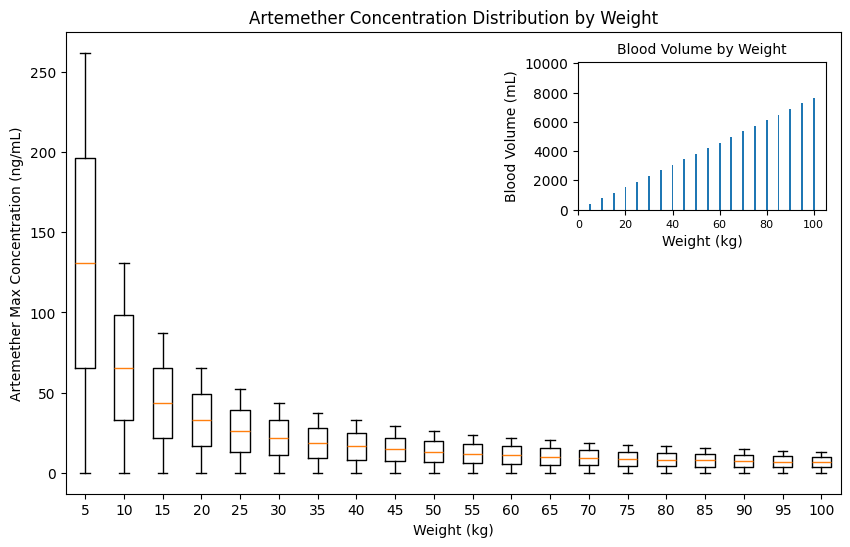

In [548]:
# Plotting the artemther concentrations for all weights as box plots
fig, ax = plt.subplots(figsize=(10, 6))
ax.boxplot(artemether_max_concentrations, labels=weight_values)
ax.set_xlabel('Weight (kg)')
#ax.set_ylim(0, 3)
ax.set_ylabel('Artemether Max Concentration (ng/mL)')
ax.set_title('Artemether Concentration Distribution by Weight')


from mpl_toolkits.axes_grid1.inset_locator import inset_axes
inset_ax = inset_axes(parent_axes=ax, width="40%", height="40%", loc='upper right', bbox_to_anchor=(0.19, 0.15, 0.8, 0.8),
                      bbox_transform=ax.transAxes)
inset_ax.bar(weight_values, blood_volume_values)
inset_ax.set_xlabel('Weight (kg)', fontsize=10)
inset_ax.set_xticks(np.arange(0, 101, 20))
inset_ax.set_xticklabels(np.arange(0, 101, 20), fontsize=8)
inset_ax.set_ylim(0, 10100)
inset_ax.set_yticks(np.arange(0, 10100, 2000))
inset_ax.set_ylabel('Blood Volume (mL)', fontsize=10)
inset_ax.set_title('Blood Volume by Weight', fontsize=10)

plt.show()

In [549]:
kill_fraction = []
killing_rates = []

for i in range(0, len(artemether_max_concentrations)):
    temp_kill_fraction = []
    temp_killing_rates = []
    for concentration in artemether_max_concentrations[i]:
        temp_kill_fraction.append(sigmoid_function(concentration, pmax, ec50_concentrations[i], n))
        temp_killing_rates.append((-1/24) * np.log(1.0 - temp_kill_fraction[-1]))
    kill_fraction.append(temp_kill_fraction)
    killing_rates.append(temp_killing_rates)

growth_rate = 0.048 
effect = [] 

for i in range(len(killing_rates)):
    effect.append(growth_rate - np.array(killing_rates[i]))

kill_percent = []
for i in range(len(kill_fraction)):
    temp_kill_percent = []
    for j in range(len(kill_fraction[i])):
        temp_kill_percent.append(kill_fraction[i][j] * 100)
    kill_percent.append(temp_kill_percent)

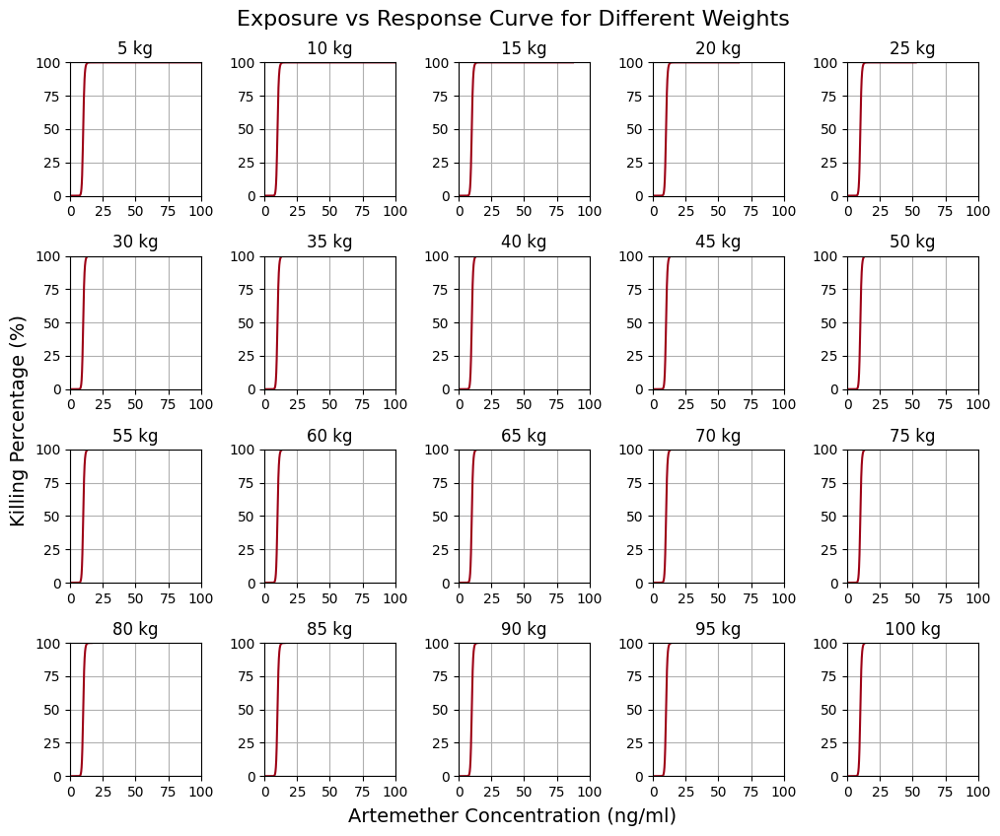

In [550]:
# Creating subplots for each weight for only killing percentage
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    # axs[i // 5, i % 5].set_xlabel('Artemether Concentration (ng/ml)')
    # axs[i // 5, i % 5].set_ylabel('Killing Percentage (%)')
    axs[i // 5, i % 5].set_xlim(0, 100)
    axs[i // 5, i % 5].set_xticks(np.arange(0, 101, 25))
    axs[i // 5, i % 5].set_ylim(0, 100)
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=12)
    axs[i // 5, i % 5].grid()
#Setting common labels for the entire figure
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=14)
fig.text(-0.01, 0.5, 'Killing Percentage (%)', va='center', rotation='vertical', fontsize=14)
fig.text(0.5, 1.0, 'Exposure vs Response Curve for Different Weights', ha='center', fontsize=16)
plt.tight_layout()
plt.show()

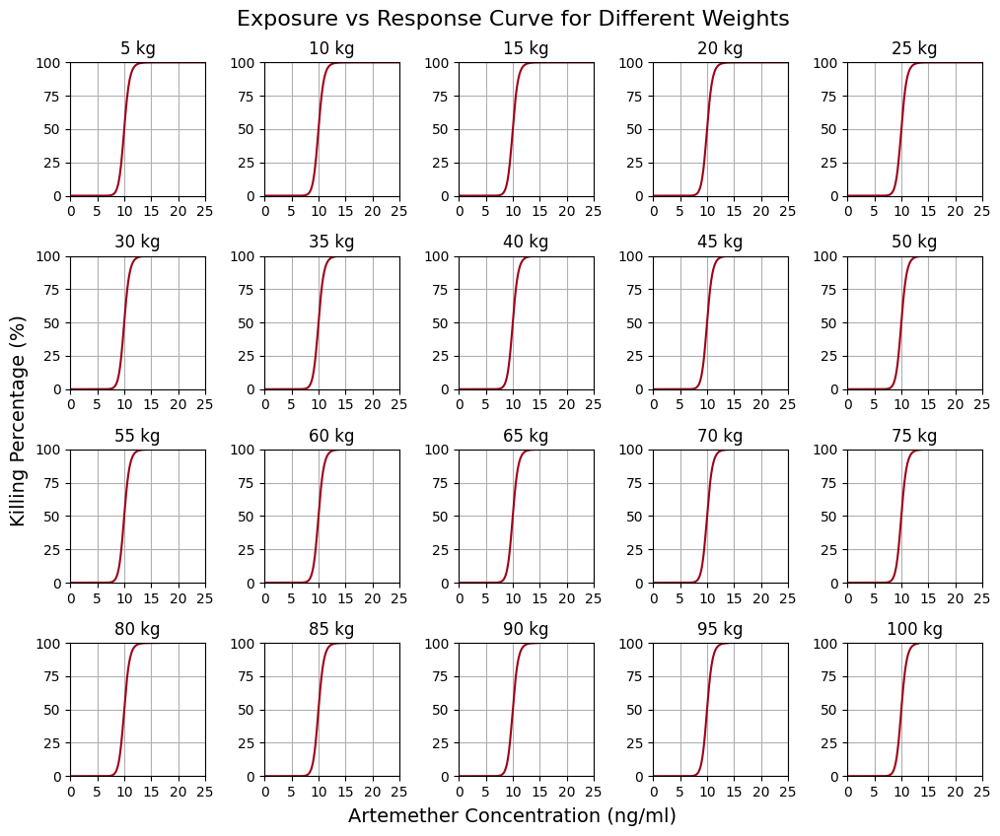

In [553]:
# Creating subplots for each weight for only killing percentage
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    # axs[i // 5, i % 5].set_xlabel('Artemether Concentration (ng/ml)')
    # axs[i // 5, i % 5].set_ylabel('Killing Percentage (%)')
    axs[i // 5, i % 5].set_xlim(0, 25)
    axs[i // 5, i % 5].set_xticks(np.arange(0, 26, 5))
    axs[i // 5, i % 5].set_ylim(0, 100)
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=12)
    axs[i // 5, i % 5].grid()
#Setting common labels for the entire figure
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=14)
fig.text(-0.01, 0.5, 'Killing Percentage (%)', va='center', rotation='vertical', fontsize=14)
fig.text(0.5, 1.0, 'Exposure vs Response Curve for Different Weights', ha='center', fontsize=16)
plt.tight_layout()
plt.show()

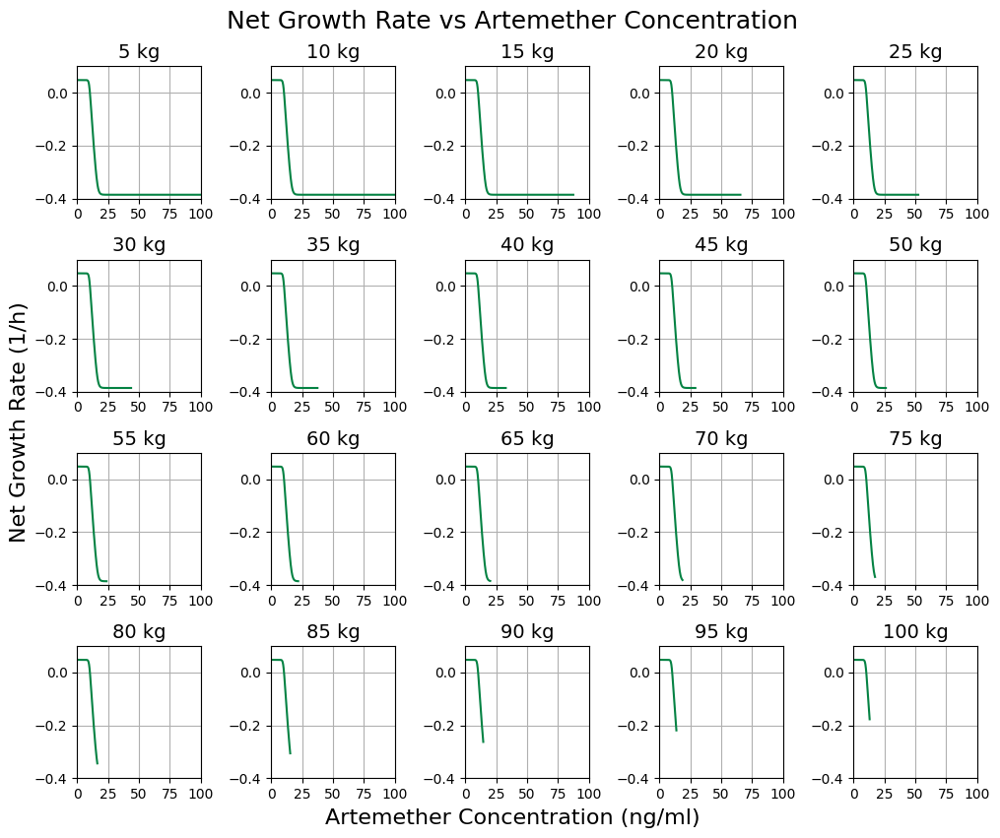

In [561]:
# Creating subplots for each weight for only net growth rate
# 4 x 5 subplots
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_max_concentrations[i], effect[i], label=f'Weight: {weight_values[i]} kg', color="#048243")
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=14)
    axs[i // 5, i % 5].set_xlim(0, 100)
    axs[i // 5, i % 5].set_xticks(np.arange(0, 101, 25))
    axs[i // 5, i % 5].set_ylim(-0.4, 0.1)
    axs[i // 5, i % 5].grid()
    #axs[i // 5, i % 5].legend(loc='upper right', bbox_to_anchor=(1.25, 1))
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=16)
fig.text(-0.01, 0.5, 'Net Growth Rate (1/h)', va='center', rotation='vertical', fontsize=16)
fig.text(0.5, 1.0, 'Net Growth Rate vs Artemether Concentration', ha='center', fontsize=18)
plt.tight_layout()
plt.show()

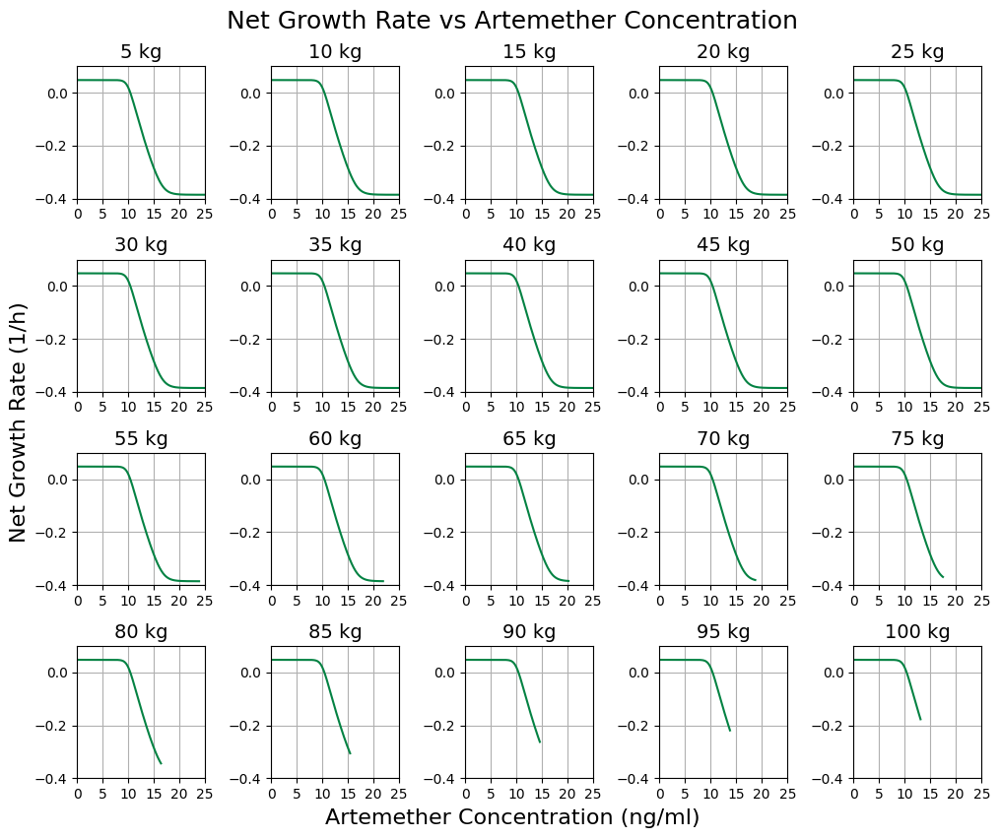

In [562]:
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_max_concentrations[i], effect[i], label=f'Weight: {weight_values[i]} kg', color="#048243")
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=14)
    axs[i // 5, i % 5].set_xlim(0, 25)
    axs[i // 5, i % 5].set_xticks(np.arange(0, 26, 5))
    axs[i // 5, i % 5].set_ylim(-0.4, 0.1)
    axs[i // 5, i % 5].grid()
    #axs[i // 5, i % 5].legend(loc='upper right', bbox_to_anchor=(1.25, 1))
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=16)
fig.text(-0.01, 0.5, 'Net Growth Rate (1/h)', va='center', rotation='vertical', fontsize=16)
fig.text(0.5, 1.0, 'Net Growth Rate vs Artemether Concentration', ha='center', fontsize=18)
plt.tight_layout()
plt.show()

#### Interesting... let's run the model with these parameters

In [565]:
import subprocess
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolacors
import pickle
from tqdm import tqdm  # For progress bar
from multiprocessing import Pool, cpu_count
import os
import sys
import time
import datetime 
from math import *

In [822]:
0.01 * 1000

10.0

In [ ]:
weight_values = list(range(5, 101, 5))

weight_values = list(range(5, 101, 5)) 
artemether_max_dose = []
lower_limit = 0 # ng
upper_limit = 100000 # ng

# Creating a range of artemether concentrations
for i in range(0, len(weight_values)):
    scaled_lower_limit = lower_limit * (weight_values[i]**0.75)  # Assuming 70 kg as a reference weight
    scaled_upper_limit = upper_limit * (weight_values[i]**0.75)  # Assuming 70 kg as a reference weight
    artemether_max_dose.append(np.linspace(scaled_lower_limit, scaled_upper_limit, 1000))
    print(f"Weight: {weight_values[i]} kg, Scaled Lower Limt: {scaled_lower_limit} ng, Scaled Upper Limit: {scaled_upper_limit} ng")

pmax = 0.99997
ec50_dose = 0.01 * 1000
n = 20
ec50_concentrations = [ec50_dose for weight in weight_values] # Assuming ec50 is already a concentration


Weight: 5 kg, Scaled Lower Limit: 0.0 ng, Scaled Upper Limit: 334370.152488211 ng
Weight: 10 kg, Scaled Lower Limit: 0.0 ng, Scaled Upper Limit: 562341.3251903491 ng
Weight: 15 kg, Scaled Lower Limit: 0.0 ng, Scaled Upper Limit: 762199.1222319221 ng
Weight: 20 kg, Scaled Lower Limit: 0.0 ng, Scaled Upper Limit: 945741.6090031759 ng
Weight: 25 kg, Scaled Lower Limit: 0.0 ng, Scaled Upper Limit: 1118033.988749895 ng
Weight: 30 kg, Scaled Lower Limit: 0.0 ng, Scaled Upper Limit: 1281861.019188702 ng
Weight: 35 kg, Scaled Lower Limit: 0.0 ng, Scaled Upper Limit: 1438967.659151819 ng
Weight: 40 kg, Scaled Lower Limit: 0.0 ng, Scaled Upper Limit: 1590541.4575341013 ng
Weight: 45 kg, Scaled Lower Limit: 0.0 ng, Scaled Upper Limit: 1737438.2779324036 ng
Weight: 50 kg, Scaled Lower Limit: 0.0 ng, Scaled Upper Limit: 1880301.5465431968 ng
Weight: 55 kg, Scaled Lower Limit: 0.0 ng, Scaled Upper Limit: 2019630.9484414759 ng
Weight: 60 kg, Scaled Lower Limit: 0.0 ng, Scaled Upper Limit: 2155824.671

In [568]:
blood_volume_values = []

bmi_ideal_body_weight = 22 #kg/m**2
blood_volume_ideal_body_weight = 70 # mL/kg

for weight in weight_values:
    volume = weight * (blood_volume_ideal_body_weight / np.sqrt(18.5/bmi_ideal_body_weight))
    blood_volume_values.append(volume)
    print(f"Weight: {weight} kg, Blood Volume: {volume} mL")

Weight: 5 kg, Blood Volume: 381.6748297643895 mL
Weight: 10 kg, Blood Volume: 763.349659528779 mL
Weight: 15 kg, Blood Volume: 1145.0244892931685 mL
Weight: 20 kg, Blood Volume: 1526.699319057558 mL
Weight: 25 kg, Blood Volume: 1908.3741488219473 mL
Weight: 30 kg, Blood Volume: 2290.048978586337 mL
Weight: 35 kg, Blood Volume: 2671.7238083507264 mL
Weight: 40 kg, Blood Volume: 3053.398638115116 mL
Weight: 45 kg, Blood Volume: 3435.073467879505 mL
Weight: 50 kg, Blood Volume: 3816.7482976438946 mL
Weight: 55 kg, Blood Volume: 4198.423127408284 mL
Weight: 60 kg, Blood Volume: 4580.097957172674 mL
Weight: 65 kg, Blood Volume: 4961.772786937063 mL
Weight: 70 kg, Blood Volume: 5343.447616701453 mL
Weight: 75 kg, Blood Volume: 5725.122446465842 mL
Weight: 80 kg, Blood Volume: 6106.797276230232 mL
Weight: 85 kg, Blood Volume: 6488.472105994621 mL
Weight: 90 kg, Blood Volume: 6870.14693575901 mL
Weight: 95 kg, Blood Volume: 7251.8217655234 mL
Weight: 100 kg, Blood Volume: 7633.496595287789 mL


In [569]:
artemether_max_concentrations = []
for i in range(0, len(blood_volume_values)):
    temp_conc = []
    for j in range(0, len(artemether_max_dose[i])): 
        temp_conc.append(artemether_max_dose[i][j] / np.array(blood_volume_values[i]))
        print(f"Weight: {weight_values[i]} kg, Artemether Max Dose: {artemether_max_dose[i][j]} ng, Blood Volume: {blood_volume_values[i]} mL, Artemether Concentration: {temp_conc[j]} ng/mL")
    artemether_max_concentrations.append(temp_conc)

Weight: 5 kg, Artemether Max Dose: 0.0 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 0.0 ng/mL
Weight: 5 kg, Artemether Max Dose: 334.70485734555655 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 0.8769372021523457 ng/mL
Weight: 5 kg, Artemether Max Dose: 669.4097146911131 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 1.7538744043046914 ng/mL
Weight: 5 kg, Artemether Max Dose: 1004.1145720366696 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 2.630811606457037 ng/mL
Weight: 5 kg, Artemether Max Dose: 1338.8194293822262 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 3.507748808609383 ng/mL
Weight: 5 kg, Artemether Max Dose: 1673.5242867277827 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 4.384686010761729 ng/mL
Weight: 5 kg, Artemether Max Dose: 2008.2291440733393 ng, Blood Volume: 381.6748297643895 mL, Artemether Concentration: 5.261623212914074 ng/mL
Weight: 5 kg, Arteme

/tmp/ipykernel_44985/4281093969.py:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(artemether_max_concentrations, labels=weight_values)


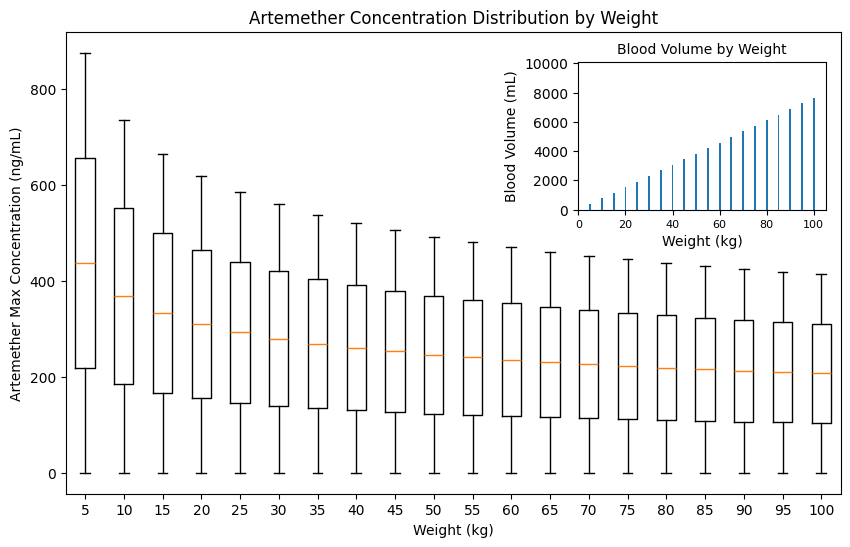

In [570]:
# Plotting the artemther concentrations for all weights as box plots
fig, ax = plt.subplots(figsize=(10, 6))
ax.boxplot(artemether_max_concentrations, labels=weight_values)
ax.set_xlabel('Weight (kg)')
#ax.set_ylim(0, 3)
ax.set_ylabel('Artemether Max Concentration (ng/mL)')
ax.set_title('Artemether Concentration Distribution by Weight')


from mpl_toolkits.axes_grid1.inset_locator import inset_axes
inset_ax = inset_axes(parent_axes=ax, width="40%", height="40%", loc='upper right', bbox_to_anchor=(0.19, 0.15, 0.8, 0.8),
                      bbox_transform=ax.transAxes)
inset_ax.bar(weight_values, blood_volume_values)
inset_ax.set_xlabel('Weight (kg)', fontsize=10)
inset_ax.set_xticks(np.arange(0, 101, 20))
inset_ax.set_xticklabels(np.arange(0, 101, 20), fontsize=8)
inset_ax.set_ylim(0, 10100)
inset_ax.set_yticks(np.arange(0, 10100, 2000))
inset_ax.set_ylabel('Blood Volume (mL)', fontsize=10)
inset_ax.set_title('Blood Volume by Weight', fontsize=10)

plt.show()

In [571]:
kill_fraction = []
killing_rates = []

for i in range(0, len(artemether_max_concentrations)):
    temp_kill_fraction = []
    temp_killing_rates = []
    for concentration in artemether_max_concentrations[i]:
        temp_kill_fraction.append(sigmoid_function(concentration, pmax, ec50_concentrations[i], n))
        temp_killing_rates.append((-1/24) * np.log(1.0 - temp_kill_fraction[-1]))
    kill_fraction.append(temp_kill_fraction)
    killing_rates.append(temp_killing_rates)

growth_rate = 0.048 
effect = [] 

for i in range(len(killing_rates)):
    effect.append(growth_rate - np.array(killing_rates[i]))

kill_percent = []
for i in range(len(kill_fraction)):
    temp_kill_percent = []
    for j in range(len(kill_fraction[i])):
        temp_kill_percent.append(kill_fraction[i][j] * 100)
    kill_percent.append(temp_kill_percent)

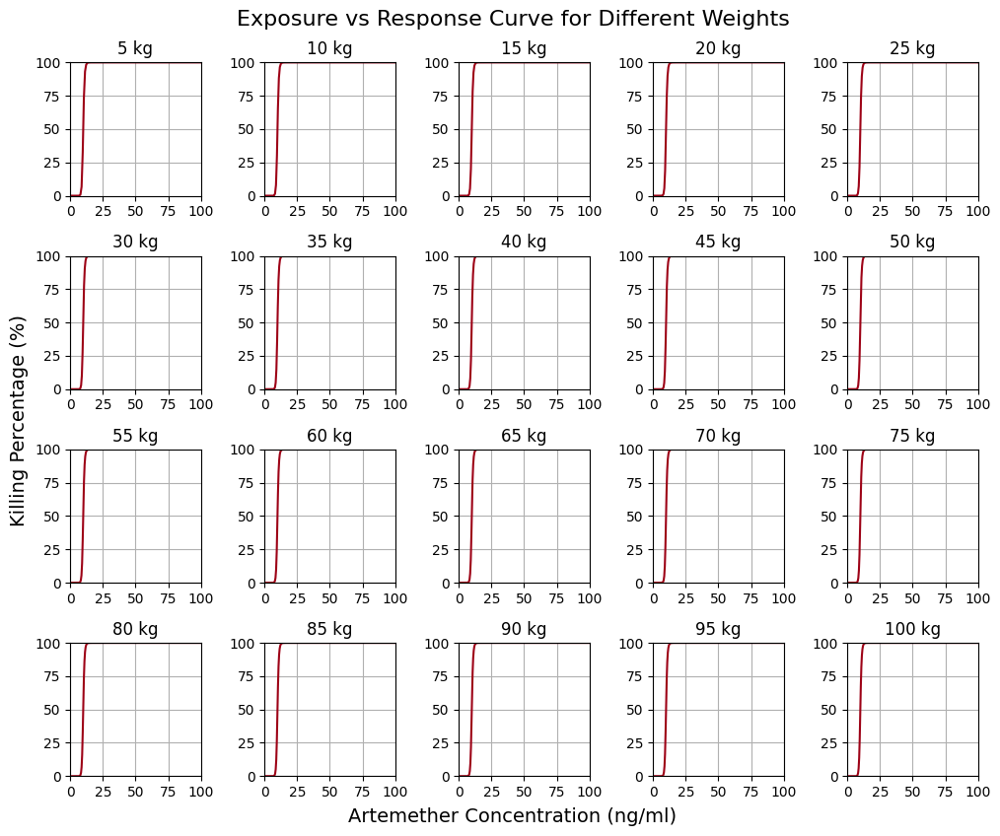

In [572]:
# Creating subplots for each weight for only killing percentage
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    # axs[i // 5, i % 5].set_xlabel('Artemether Concentration (ng/ml)')
    # axs[i // 5, i % 5].set_ylabel('Killing Percentage (%)')
    axs[i // 5, i % 5].set_xlim(0, 100)
    axs[i // 5, i % 5].set_xticks(np.arange(0, 101, 25))
    axs[i // 5, i % 5].set_ylim(0, 100)
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=12)
    axs[i // 5, i % 5].grid()
#Setting common labels for the entire figure
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=14)
fig.text(-0.01, 0.5, 'Killing Percentage (%)', va='center', rotation='vertical', fontsize=14)
fig.text(0.5, 1.0, 'Exposure vs Response Curve for Different Weights', ha='center', fontsize=16)
plt.tight_layout()
plt.show()

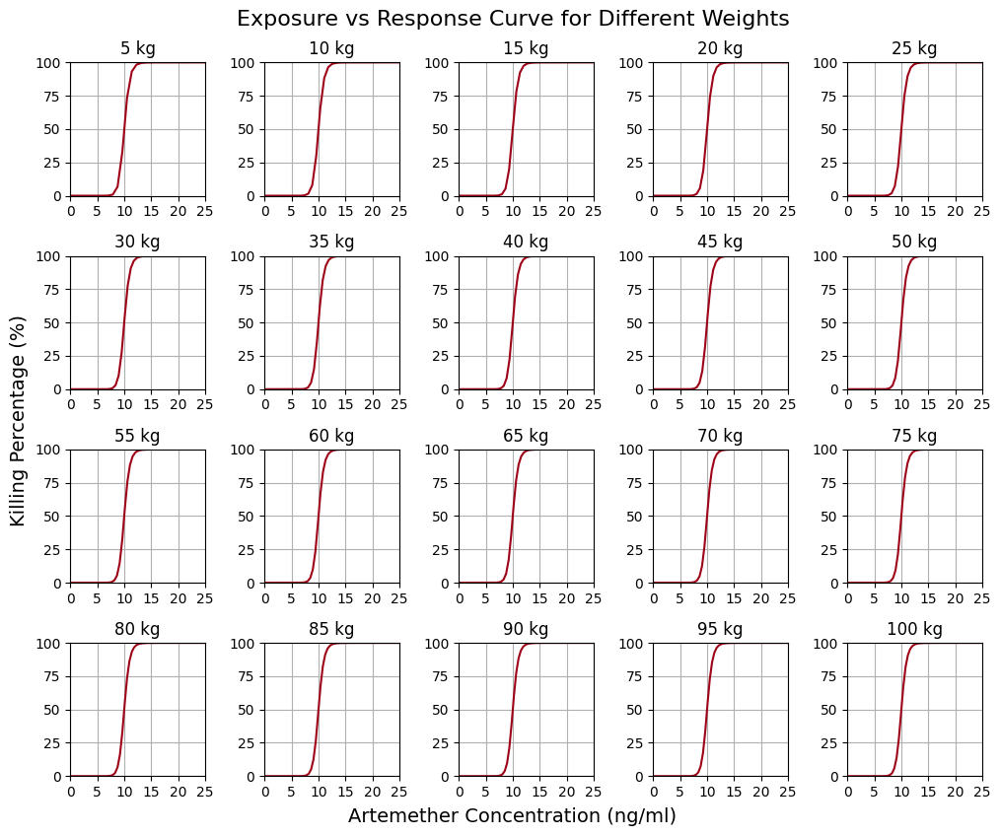

In [573]:
# Creating subplots for each weight for only killing percentage
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_max_concentrations[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    # axs[i // 5, i % 5].set_xlabel('Artemether Concentration (ng/ml)')
    # axs[i // 5, i % 5].set_ylabel('Killing Percentage (%)')
    axs[i // 5, i % 5].set_xlim(0, 25)
    axs[i // 5, i % 5].set_xticks(np.arange(0, 26, 5))
    axs[i // 5, i % 5].set_ylim(0, 100)
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=12)
    axs[i // 5, i % 5].grid()
#Setting common labels for the entire figure
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=14)
fig.text(-0.01, 0.5, 'Killing Percentage (%)', va='center', rotation='vertical', fontsize=14)
fig.text(0.5, 1.0, 'Exposure vs Response Curve for Different Weights', ha='center', fontsize=16)
plt.tight_layout()
plt.show()

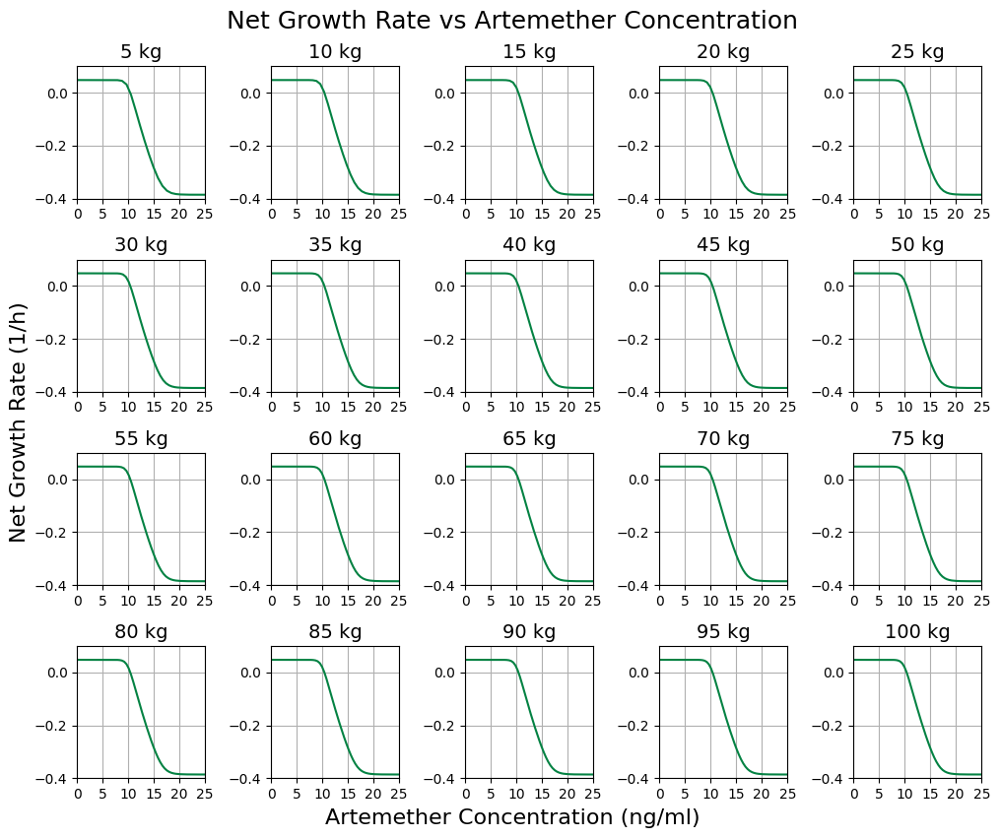

In [575]:
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_max_concentrations[i], effect[i], label=f'Weight: {weight_values[i]} kg', color="#048243")
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=14)
    axs[i // 5, i % 5].set_xlim(0, 25)
    axs[i // 5, i % 5].set_xticks(np.arange(0, 26, 5))
    axs[i // 5, i % 5].set_ylim(-0.4, 0.1)
    axs[i // 5, i % 5].grid()
    #axs[i // 5, i % 5].legend(loc='upper right', bbox_to_anchor=(1.25, 1))
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=16)
fig.text(-0.01, 0.5, 'Net Growth Rate (1/h)', va='center', rotation='vertical', fontsize=16)
fig.text(0.5, 1.0, 'Net Growth Rate vs Artemether Concentration', ha='center', fontsize=18)
plt.tight_layout()
plt.show()

In [ ]:
# Function to run a single simulation for a given weight value

def run_single_weight_simulation(n_patients, pmax_artemether, weight):
    start_time = time.monotonic()
    command_weight = [
        "/home/venitha_b/Projects/2019-test-ppq-pk/build/run_ppq_pk",
        "--AL",
        "-n", str(n_patients),
        "--pmax_artemether", str(pmax_artemether),
        "--ec50_lum", "72.789",
        "--weight", str(weight),
        "--ec50_artemether", "10",
        "-o", "1"
    ]

    try:
        # Run the command and capture output
        output_weight = subprocess.run(command_weight, capture_output=True, text=True, check=True)

        # Process the output
        lines_weight = output_weight.stdout.splitlines()
        df_weight = pd.DataFrame([line.split() for line in lines_weight], columns=["PID", "HOUR", "COMP2CONC_ARTEMETHER", "COMP2CONC_LUM", "PARASITEDENSITY"])
        
        # Clean the DataFrame
        df_weight = df_weight.iloc[1:].apply(pd.to_numeric, errors='coerce')

        # Clean the DataFrame
        df_weight = df_weight.iloc[1:].apply(pd.to_numeric, errors='coerce')

        # Calculate the efficacy
        failed_treatment_count = df_weight[df_weight['PARASITEDENSITY'] >= 10].shape[0]
        total_patients = df_weight['PID'].nunique()
        efficacy = (100 - ((failed_treatment_count / total_patients) * 100)) if total_patients > 0 else 0
        
        end_time = time.monotonic()
        today = datetime.date.today()
        print("\nToday's date: ", today, "\n")
        print("Length of simulation: ", datetime.timedelta(seconds=end_time - start_time), "\n")

        return efficacy, df_weight, pmax_artemether, failed_treatment_count

    except subprocess.CalledProcessError as e:
        print(f"Error in subprocess for weight: {weight}: {e}")
        return np.nan, None, pmax_artemether, 0  # Return NaN, None, and 0 in case of failure
    except Exception as e:
        print(f"An unexpected error occurred for weight: {weight}: {e}")
        return np.nan, None, pmax_artemether, 0  # Return NaN, None, and 0 in case of failure

In [740]:
for i in range(len(weight_values)):
    dose = 40 * (weight_values[i] ** 0.75)  # Assuming 40 mg is the base dose for a 70 kg person
    print(f"Weight: {weight_values[i]} kg, Dose: {dose} mg")

Weight: 5 kg, Dose: 133.7480609952844 mg
Weight: 10 kg, Dose: 224.93653007613966 mg
Weight: 15 kg, Dose: 304.87964889276884 mg
Weight: 20 kg, Dose: 378.2966436012703 mg
Weight: 25 kg, Dose: 447.21359549995793 mg
Weight: 30 kg, Dose: 512.7444076754808 mg
Weight: 35 kg, Dose: 575.5870636607276 mg
Weight: 40 kg, Dose: 636.2165830136405 mg
Weight: 45 kg, Dose: 694.9753111729615 mg
Weight: 50 kg, Dose: 752.1206186172788 mg
Weight: 55 kg, Dose: 807.8523793765903 mg
Weight: 60 kg, Dose: 862.3298687114021 mg
Weight: 65 kg, Dose: 915.6826993140414 mg
Weight: 70 kg, Dose: 968.0181969974349 mg
Weight: 75 kg, Dose: 1019.4265469082735 mg
Weight: 80 kg, Dose: 1069.9844879622751 mg
Weight: 85 kg, Dose: 1119.7580301975213 mg
Weight: 90 kg, Dose: 1168.8044957103562 mg
Weight: 95 kg, Dose: 1217.1740797482348 mg
Weight: 100 kg, Dose: 1264.9110640673516 mg


In [741]:
def generate_recommended_dosing_schedule(weight):
    if weight < 15.0:
        num_tablets_per_dose = 0.50
    elif weight < 25.0:
        num_tablets_per_dose = 1.0
    elif weight < 35.0:
        num_tablets_per_dose = 1.50
    else:
        num_tablets_per_dose = 2.0
    total_mg_dose_per_occassion = num_tablets_per_dose * 40.0;
    return total_mg_dose_per_occassion

In [742]:
for i in range(len(weight_values)):
    print("Weight: ", weight_values[i], " kg, Recommended Dose: ", generate_recommended_dosing_schedule(weight_values[i]), " mg")

Weight:  5  kg, Recommended Dose:  20.0  mg
Weight:  10  kg, Recommended Dose:  20.0  mg
Weight:  15  kg, Recommended Dose:  40.0  mg
Weight:  20  kg, Recommended Dose:  40.0  mg
Weight:  25  kg, Recommended Dose:  60.0  mg
Weight:  30  kg, Recommended Dose:  60.0  mg
Weight:  35  kg, Recommended Dose:  80.0  mg
Weight:  40  kg, Recommended Dose:  80.0  mg
Weight:  45  kg, Recommended Dose:  80.0  mg
Weight:  50  kg, Recommended Dose:  80.0  mg
Weight:  55  kg, Recommended Dose:  80.0  mg
Weight:  60  kg, Recommended Dose:  80.0  mg
Weight:  65  kg, Recommended Dose:  80.0  mg
Weight:  70  kg, Recommended Dose:  80.0  mg
Weight:  75  kg, Recommended Dose:  80.0  mg
Weight:  80  kg, Recommended Dose:  80.0  mg
Weight:  85  kg, Recommended Dose:  80.0  mg
Weight:  90  kg, Recommended Dose:  80.0  mg
Weight:  95  kg, Recommended Dose:  80.0  mg
Weight:  100  kg, Recommended Dose:  80.0  mg


In [745]:
# Generating total dose for each weight over 3 days with twice daily dosing
total_dose = []
for weight in weight_values:
    total_mg_dose = generate_recommended_dosing_schedule(weight) * 6  # Assuming 3 days of treatment
    total_dose.append(total_mg_dose)
for i in range(len(weight_values)):
    print(f"Total dose for weight {weight_values[i]} kg: {total_dose[i]} mg")

Total dose for weight 5 kg: 120.0 mg
Total dose for weight 10 kg: 120.0 mg
Total dose for weight 15 kg: 240.0 mg
Total dose for weight 20 kg: 240.0 mg
Total dose for weight 25 kg: 360.0 mg
Total dose for weight 30 kg: 360.0 mg
Total dose for weight 35 kg: 480.0 mg
Total dose for weight 40 kg: 480.0 mg
Total dose for weight 45 kg: 480.0 mg
Total dose for weight 50 kg: 480.0 mg
Total dose for weight 55 kg: 480.0 mg
Total dose for weight 60 kg: 480.0 mg
Total dose for weight 65 kg: 480.0 mg
Total dose for weight 70 kg: 480.0 mg
Total dose for weight 75 kg: 480.0 mg
Total dose for weight 80 kg: 480.0 mg
Total dose for weight 85 kg: 480.0 mg
Total dose for weight 90 kg: 480.0 mg
Total dose for weight 95 kg: 480.0 mg
Total dose for weight 100 kg: 480.0 mg


In [746]:
# Converting total dose to ng
total_dose_ng = [dose * 1e6 for dose in total_dose]
print("Total dose in ng:", total_dose_ng)

Total dose in ng: [120000000.0, 120000000.0, 240000000.0, 240000000.0, 360000000.0, 360000000.0, 480000000.0, 480000000.0, 480000000.0, 480000000.0, 480000000.0, 480000000.0, 480000000.0, 480000000.0, 480000000.0, 480000000.0, 480000000.0, 480000000.0, 480000000.0, 480000000.0]


In [747]:
upper_limit_ng = total_dose_ng

In [748]:
lower_limit_ng = [0] * len(weight_values)  # Assuming lower limit is 0 ng for all weights

In [749]:
# Scaling the lower and upper limits and converting it into concentrations
lower_limit_concentration = []
upper_limit_concentration = []

for i in range(len(weight_values)):
    lower_limit_concentration.append(lower_limit_ng[i] / ((weight_values[i] ** 0.25)* 64.191))  
    upper_limit_concentration.append(upper_limit_ng[i] / ((weight_values[i] ** 0.25)* 64.191))  

artemether_concentrations_ng_ml_final = []
for i in range(len(weight_values)):
    temp_conc = np.linspace(lower_limit_concentration[i], upper_limit_concentration[i], 1000)
    artemether_concentrations_ng_ml_final.append(temp_conc)

In [750]:
for i in range(len(artemether_concentrations_ng_ml_final)):
    print(f"Weight: {weight_values[i]} kg, Artemether Concentration Range: {artemether_concentrations_ng_ml_final[i][0]} ng/mL to {artemether_concentrations_ng_ml_final[i][-1]} ng/mL")

Weight: 5 kg, Artemether Concentration Range: 0.0 ng/mL to 1250157.134133611 ng/mL
Weight: 10 kg, Artemether Concentration Range: 0.0 ng/mL to 1051252.6525968108 ng/mL
Weight: 15 kg, Artemether Concentration Range: 0.0 ng/mL to 1899828.0063732849 ng/mL
Weight: 20 kg, Artemether Concentration Range: 0.0 ng/mL to 1767989.1741892337 ng/mL
Weight: 25 kg, Artemether Concentration Range: 0.0 ng/mL to 2508091.3894468825 ng/mL
Weight: 30 kg, Artemether Concentration Range: 0.0 ng/mL to 2396337.8402368594 ng/mL
Weight: 35 kg, Artemether Concentration Range: 0.0 ng/mL to 3074327.181571395 ng/mL
Weight: 40 kg, Artemether Concentration Range: 0.0 ng/mL to 2973391.517566203 ng/mL
Weight: 45 kg, Artemether Concentration Range: 0.0 ng/mL to 2887114.231685486 ng/mL
Weight: 50 kg, Artemether Concentration Range: 0.0 ng/mL to 2812060.0780194555 ng/mL
Weight: 55 kg, Artemether Concentration Range: 0.0 ng/mL to 2745847.5635975823 ng/mL
Weight: 60 kg, Artemether Concentration Range: 0.0 ng/mL to 2686762.53

In [751]:
#Convert artemether_concentrations_ng_ml_final to artemether_concentrations_mg_ml_final
artemether_concentrations_mg_ml_final = []
for i in range(len(artemether_concentrations_ng_ml_final)):
    temp_conc = artemether_concentrations_ng_ml_final[i] / (10**6)  # Convert ng/mL to mg/mL
    artemether_concentrations_mg_ml_final.append(temp_conc)

In [752]:
for i in range(len(artemether_concentrations_mg_ml_final)):
    print(f"Weight: {weight_values[i]} kg, Artemether Concentration Range: {artemether_concentrations_mg_ml_final[i][0]} mg/mL to {artemether_concentrations_mg_ml_final[i][-1]} mg/mL")

Weight: 5 kg, Artemether Concentration Range: 0.0 mg/mL to 1.250157134133611 mg/mL
Weight: 10 kg, Artemether Concentration Range: 0.0 mg/mL to 1.0512526525968109 mg/mL
Weight: 15 kg, Artemether Concentration Range: 0.0 mg/mL to 1.8998280063732849 mg/mL
Weight: 20 kg, Artemether Concentration Range: 0.0 mg/mL to 1.7679891741892337 mg/mL
Weight: 25 kg, Artemether Concentration Range: 0.0 mg/mL to 2.5080913894468826 mg/mL
Weight: 30 kg, Artemether Concentration Range: 0.0 mg/mL to 2.3963378402368596 mg/mL
Weight: 35 kg, Artemether Concentration Range: 0.0 mg/mL to 3.074327181571395 mg/mL
Weight: 40 kg, Artemether Concentration Range: 0.0 mg/mL to 2.973391517566203 mg/mL
Weight: 45 kg, Artemether Concentration Range: 0.0 mg/mL to 2.8871142316854863 mg/mL
Weight: 50 kg, Artemether Concentration Range: 0.0 mg/mL to 2.8120600780194556 mg/mL
Weight: 55 kg, Artemether Concentration Range: 0.0 mg/mL to 2.7458475635975823 mg/mL
Weight: 60 kg, Artemether Concentration Range: 0.0 mg/mL to 2.6867625

Text(0.5, 1.0, 'Artemether Concentration Distribution by Weight')

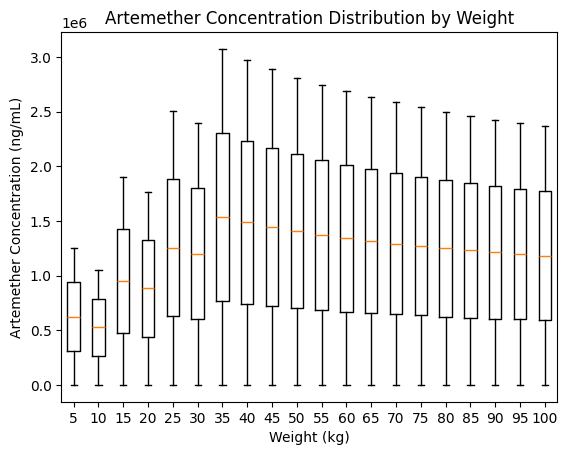

In [753]:
plt.boxplot(artemether_concentrations_ng_ml_final, tick_labels=weight_values)
plt.xlabel('Weight (kg)')
plt.ylabel('Artemether Concentration (ng/mL)')
plt.title('Artemether Concentration Distribution by Weight')

Text(0.5, 1.0, 'Artemether Concentration Distribution by Weight')

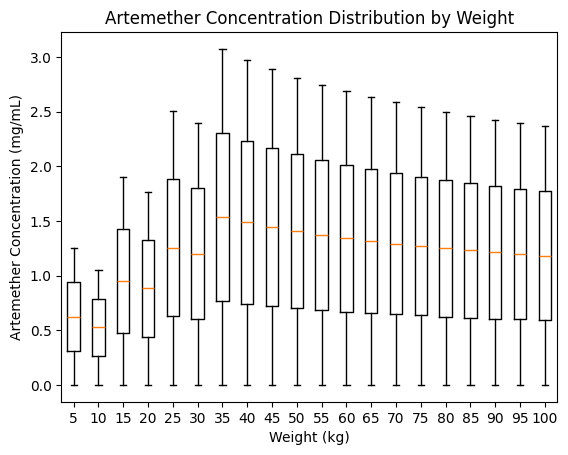

In [754]:
plt.boxplot(artemether_concentrations_mg_ml_final, tick_labels=weight_values)
plt.xlabel('Weight (kg)')
plt.ylabel('Artemether Concentration (mg/mL)')
plt.title('Artemether Concentration Distribution by Weight')

In [756]:
pmax = 0.99997
ec50_dose_ng = 100000
ec50_dose_mg = 0.1
n = 20
ec50_concentrations_ng = [ec50_dose_ng for weight in weight_values] # Assuming ec50 is already a concentration
ec50_concentrations_mg = [ec50_dose_mg for weight in weight_values]  # Convert ng/mL to mg/mL

print("EC50 Concentrations (ng/mL):", ec50_concentrations_ng)
print("EC50 Concentrations (mg/mL):", ec50_concentrations_mg)

EC50 Concentrations (ng/mL): [100000, 100000, 100000, 100000, 100000, 100000, 100000, 100000, 100000, 100000, 100000, 100000, 100000, 100000, 100000, 100000, 100000, 100000, 100000, 100000]
EC50 Concentrations (mg/mL): [0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1]


In [757]:
kill_fraction = []
killing_rates = []

for i in range(0, len(artemether_concentrations_ng_ml_final)):
    temp_kill_fraction = []
    temp_killing_rates = []
    for concentration in artemether_concentrations_ng_ml_final[i]:
        temp_kill_fraction.append(sigmoid_function(concentration, pmax, ec50_concentrations_ng[i], n))
        temp_killing_rates.append((-1/24) * np.log(1.0 - temp_kill_fraction[-1]))
    kill_fraction.append(temp_kill_fraction)
    killing_rates.append(temp_killing_rates)

growth_rate = 0.048 
effect = [] 

for i in range(len(killing_rates)):
    effect.append(growth_rate - np.array(killing_rates[i]))

kill_percent = []
for i in range(len(kill_fraction)):
    temp_kill_percent = []
    for j in range(len(kill_fraction[i])):
        temp_kill_percent.append(kill_fraction[i][j] * 100)
    kill_percent.append(temp_kill_percent)

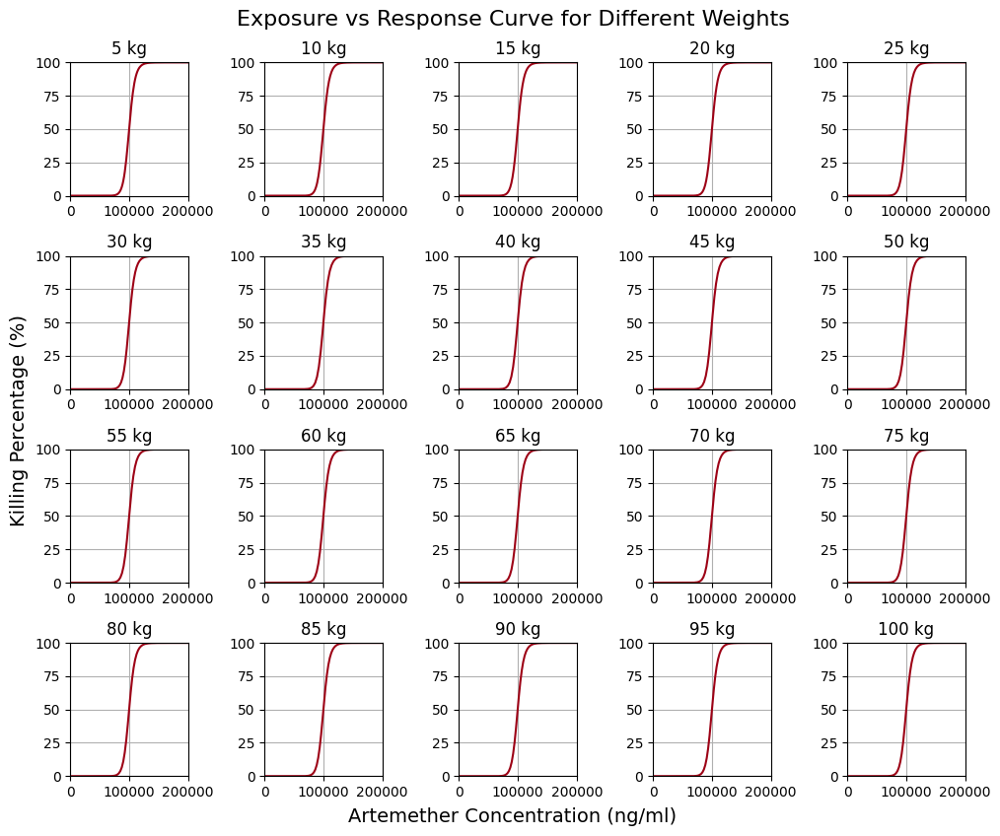

In [765]:
# Creating subplots for each weight for only killing percentage
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_concentrations_ng_ml_final[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    # axs[i // 5, i % 5].set_xlabel('Artemether Concentration (ng/ml)')
    # axs[i // 5, i % 5].set_ylabel('Killing Percentage (%)')
    axs[i // 5, i % 5].set_xlim(0, 0.2*10**6)  # Adjusted for ng/mL
    axs[i // 5, i % 5].set_ylim(0, 100)
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=12)
    axs[i // 5, i % 5].grid()
#Setting common labels for the entire figure
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=14)
fig.text(-0.01, 0.5, 'Killing Percentage (%)', va='center', rotation='vertical', fontsize=14)
fig.text(0.5, 1.0, 'Exposure vs Response Curve for Different Weights', ha='center', fontsize=16)
plt.tight_layout()
plt.show()

In [766]:
kill_fraction = []
killing_rates = []

for i in range(0, len(artemether_concentrations_mg_ml_final)):
    temp_kill_fraction = []
    temp_killing_rates = []
    for concentration in artemether_concentrations_mg_ml_final[i]:
        temp_kill_fraction.append(sigmoid_function(concentration, pmax, ec50_concentrations_mg[i], n))
        temp_killing_rates.append((-1/24) * np.log(1.0 - temp_kill_fraction[-1]))
    kill_fraction.append(temp_kill_fraction)
    killing_rates.append(temp_killing_rates)

growth_rate = 0.048 
effect = [] 

for i in range(len(killing_rates)):
    effect.append(growth_rate - np.array(killing_rates[i]))

kill_percent = []
for i in range(len(kill_fraction)):
    temp_kill_percent = []
    for j in range(len(kill_fraction[i])):
        temp_kill_percent.append(kill_fraction[i][j] * 100)
    kill_percent.append(temp_kill_percent)

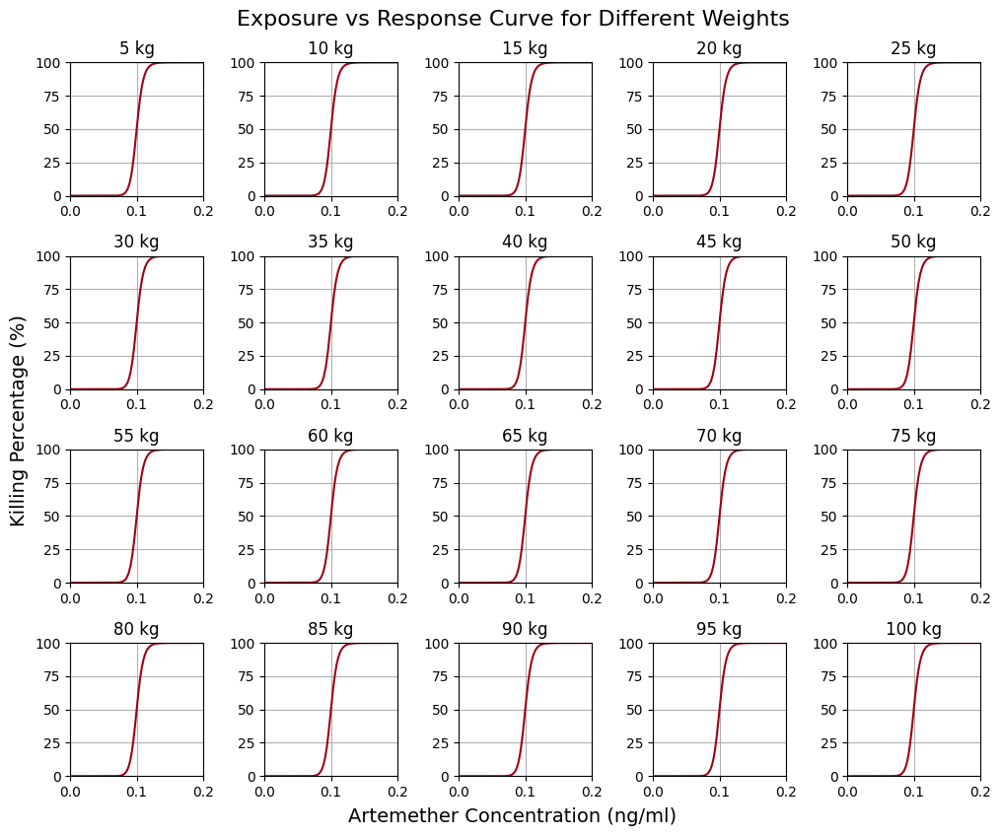

In [772]:
# Creating subplots for each weight for only killing percentage
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_concentrations_mg_ml_final[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    # axs[i // 5, i % 5].set_xlabel('Artemether Concentration (ng/ml)')
    # axs[i // 5, i % 5].set_ylabel('Killing Percentage (%)')
    axs[i // 5, i % 5].set_xlim(0, 0.2)  # Adjusted for mg/mL
    axs[i // 5, i % 5].set_ylim(0, 100)
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=12)
    axs[i // 5, i % 5].grid()
#Setting common labels for the entire figure
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=14)
fig.text(-0.01, 0.5, 'Killing Percentage (%)', va='center', rotation='vertical', fontsize=14)
fig.text(0.5, 1.0, 'Exposure vs Response Curve for Different Weights', ha='center', fontsize=16)
plt.tight_layout()
plt.show()

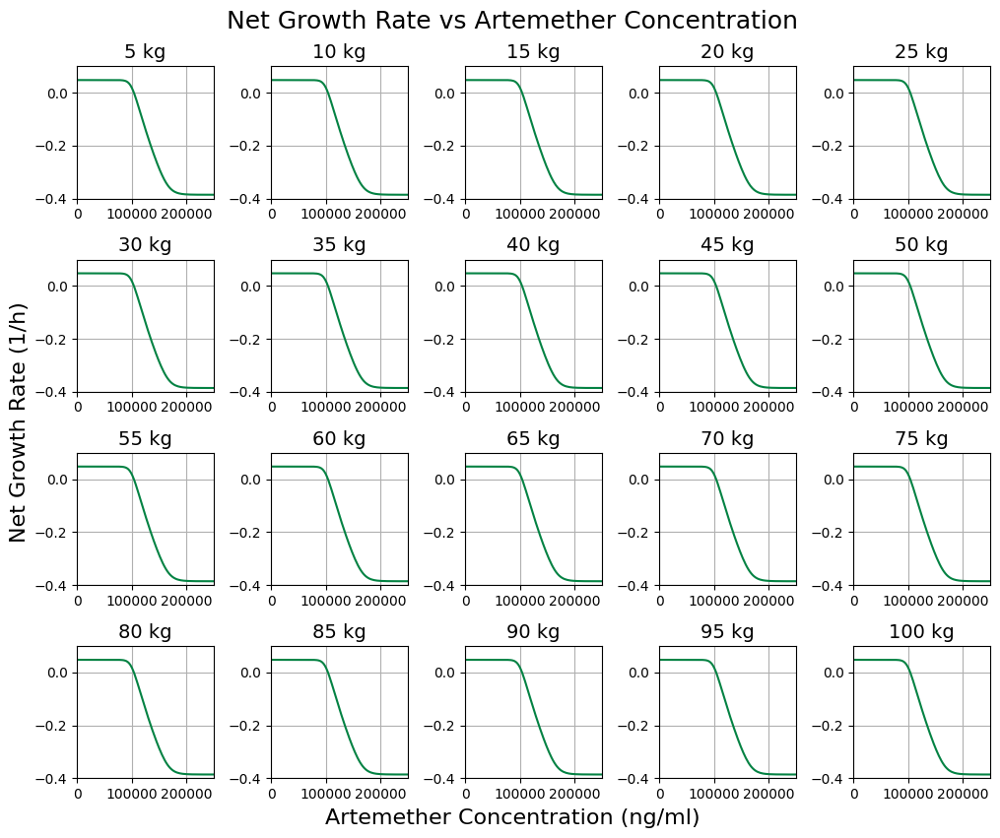

In [776]:
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_concentrations_ng_ml_final[i], effect[i], label=f'Weight: {weight_values[i]} kg', color="#048243")
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=14)
    axs[i // 5, i % 5].set_xlim(0, 0.25*10**6)  # Adjusted for ng/mL
    axs[i // 5, i % 5].set_ylim(-0.4, 0.1)
    axs[i // 5, i % 5].grid()
    #axs[i // 5, i % 5].legend(loc='upper right', bbox_to_anchor=(1.25, 1))
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=16)
fig.text(-0.01, 0.5, 'Net Growth Rate (1/h)', va='center', rotation='vertical', fontsize=16)
fig.text(0.5, 1.0, 'Net Growth Rate vs Artemether Concentration', ha='center', fontsize=18)
plt.tight_layout()
plt.show()

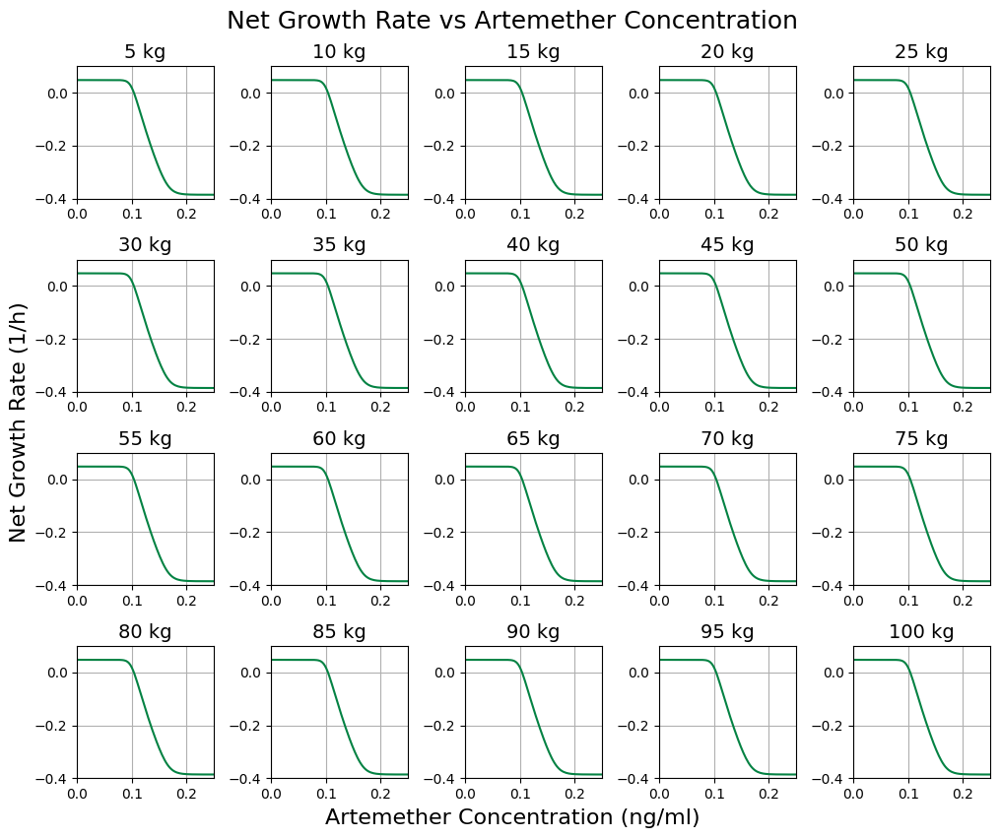

In [781]:
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_concentrations_mg_ml_final[i], effect[i], label=f'Weight: {weight_values[i]} kg', color="#048243")
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=14)
    axs[i // 5, i % 5].set_xlim(0, 0.25)  # Adjusted for ng/mL
    axs[i // 5, i % 5].set_ylim(-0.4, 0.1)
    axs[i // 5, i % 5].grid()
    #axs[i // 5, i % 5].legend(loc='upper right', bbox_to_anchor=(1.25, 1))
fig.text(0.5, -0.01, 'Artemether Concentration (mg/ml)', ha='center', fontsize=16)
fig.text(-0.01, 0.5, 'Net Growth Rate (1/h)', va='center', rotation='vertical', fontsize=16)
fig.text(0.5, 1.0, 'Net Growth Rate vs Artemether Concentration', ha='center', fontsize=18)
plt.tight_layout()
plt.show()

#### Looks like we found a solution, repeating the above analysis but with ec50_artemether = 1 ng

In [782]:
# Generating total dose for each weight over 3 days with twice daily dosing
weight_values = list(range(5, 101, 5))  # Re-defining weight values for clarity
total_dose = []
for weight in weight_values:
    total_mg_dose = generate_recommended_dosing_schedule(weight) * 6  # Assuming 3 days of treatment
    total_dose.append(total_mg_dose)
for i in range(len(weight_values)):
    print(f"Total dose for weight {weight_values[i]} kg: {total_dose[i]} mg")

upper_limit_ng = total_dose_ng
lower_limit_ng = [0] * len(weight_values)

lower_limit_concentration = []
upper_limit_concentration = []

for i in range(len(weight_values)):
    lower_limit_concentration.append(lower_limit_ng[i] / ((weight_values[i] ** 0.25)* 64.191))  
    upper_limit_concentration.append(upper_limit_ng[i] / ((weight_values[i] ** 0.25)* 64.191))  

artemether_concentrations_ng_ml_final = []
for i in range(len(weight_values)):
    temp_conc = np.linspace(lower_limit_concentration[i], upper_limit_concentration[i], 1000)
    artemether_concentrations_ng_ml_final.append(temp_conc)

#Convert artemether_concentrations_ng_ml_final to artemether_concentrations_mg_ml_final
artemether_concentrations_mg_ml_final = []
for i in range(len(artemether_concentrations_ng_ml_final)):
    temp_conc = artemether_concentrations_ng_ml_final[i] / (10**6)  # Convert ng/mL to mg/mL
    artemether_concentrations_mg_ml_final.append(temp_conc)

pmax = 0.99997
ec50_dose_ng = 1
ec50_dose_mg = 1/(10**6)  # Convert ng/mL to mg/mL
n = 20
ec50_concentrations_ng = [ec50_dose_ng for weight in weight_values] # Assuming ec50 is already a concentration
ec50_concentrations_mg = [ec50_dose_mg for weight in weight_values]  # Convert ng/mL to mg/mL

print("EC50 Concentrations (ng/mL):", ec50_concentrations_ng)
print("EC50 Concentrations (mg/mL):", ec50_concentrations_mg)

Total dose for weight 5 kg: 120.0 mg
Total dose for weight 10 kg: 120.0 mg
Total dose for weight 15 kg: 240.0 mg
Total dose for weight 20 kg: 240.0 mg
Total dose for weight 25 kg: 360.0 mg
Total dose for weight 30 kg: 360.0 mg
Total dose for weight 35 kg: 480.0 mg
Total dose for weight 40 kg: 480.0 mg
Total dose for weight 45 kg: 480.0 mg
Total dose for weight 50 kg: 480.0 mg
Total dose for weight 55 kg: 480.0 mg
Total dose for weight 60 kg: 480.0 mg
Total dose for weight 65 kg: 480.0 mg
Total dose for weight 70 kg: 480.0 mg
Total dose for weight 75 kg: 480.0 mg
Total dose for weight 80 kg: 480.0 mg
Total dose for weight 85 kg: 480.0 mg
Total dose for weight 90 kg: 480.0 mg
Total dose for weight 95 kg: 480.0 mg
Total dose for weight 100 kg: 480.0 mg
EC50 Concentrations (ng/mL): [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
EC50 Concentrations (mg/mL): [1e-06, 1e-06, 1e-06, 1e-06, 1e-06, 1e-06, 1e-06, 1e-06, 1e-06, 1e-06, 1e-06, 1e-06, 1e-06, 1e-06, 1e-06, 1e-06, 1e-06, 1

In [783]:
kill_fraction = []
killing_rates = []

for i in range(0, len(artemether_concentrations_ng_ml_final)):
    temp_kill_fraction = []
    temp_killing_rates = []
    for concentration in artemether_concentrations_ng_ml_final[i]:
        temp_kill_fraction.append(sigmoid_function(concentration, pmax, ec50_concentrations_ng[i], n))
        temp_killing_rates.append((-1/24) * np.log(1.0 - temp_kill_fraction[-1]))
    kill_fraction.append(temp_kill_fraction)
    killing_rates.append(temp_killing_rates)

growth_rate = 0.048 
effect = [] 

for i in range(len(killing_rates)):
    effect.append(growth_rate - np.array(killing_rates[i]))

kill_percent = []
for i in range(len(kill_fraction)):
    temp_kill_percent = []
    for j in range(len(kill_fraction[i])):
        temp_kill_percent.append(kill_fraction[i][j] * 100)
    kill_percent.append(temp_kill_percent)

In [784]:
kill_fraction = []
killing_rates = []

for i in range(0, len(artemether_concentrations_mg_ml_final)):
    temp_kill_fraction = []
    temp_killing_rates = []
    for concentration in artemether_concentrations_mg_ml_final[i]:
        temp_kill_fraction.append(sigmoid_function(concentration, pmax, ec50_concentrations_mg[i], n))
        temp_killing_rates.append((-1/24) * np.log(1.0 - temp_kill_fraction[-1]))
    kill_fraction.append(temp_kill_fraction)
    killing_rates.append(temp_killing_rates)

growth_rate = 0.048 
effect = [] 

for i in range(len(killing_rates)):
    effect.append(growth_rate - np.array(killing_rates[i]))

kill_percent = []
for i in range(len(kill_fraction)):
    temp_kill_percent = []
    for j in range(len(kill_fraction[i])):
        temp_kill_percent.append(kill_fraction[i][j] * 100)
    kill_percent.append(temp_kill_percent)

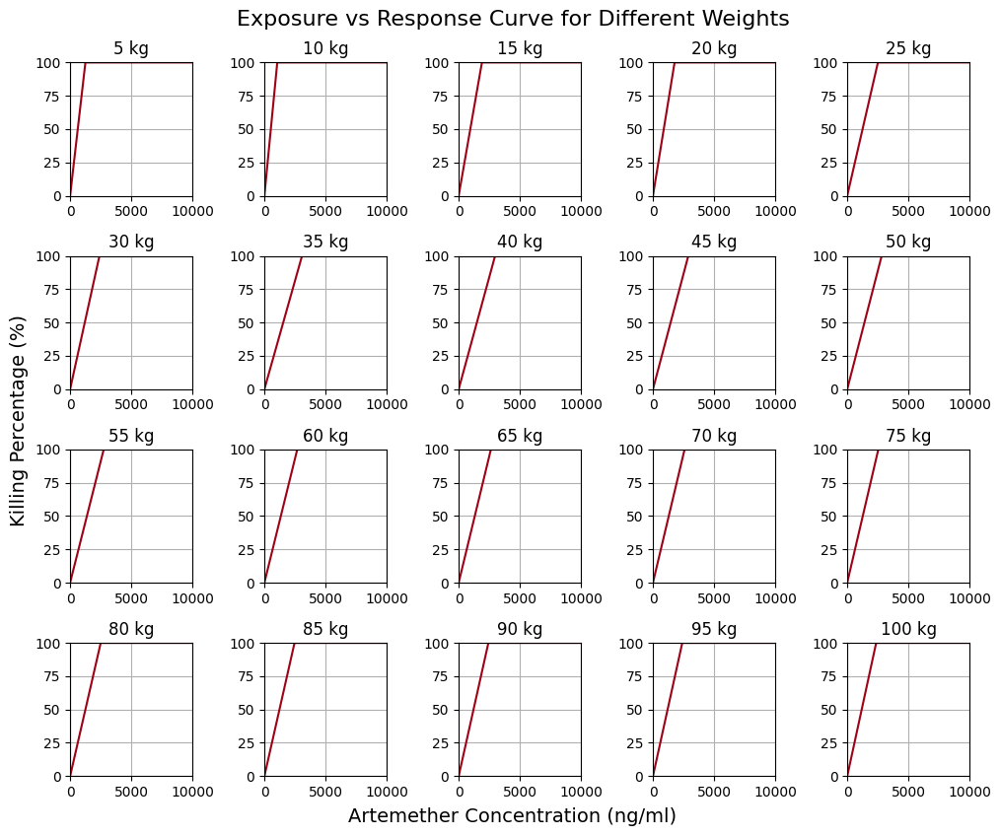

In [801]:
# Creating subplots for each weight for only killing percentage
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_concentrations_ng_ml_final[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    # axs[i // 5, i % 5].set_xlabel('Artemether Concentration (ng/ml)')
    # axs[i // 5, i % 5].set_ylabel('Killing Percentage (%)')
    axs[i // 5, i % 5].set_xlim(0, 0.01*10**6)  # Adjusted for ng/mL
    axs[i // 5, i % 5].set_ylim(0, 100)
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=12)
    axs[i // 5, i % 5].grid()
#Setting common labels for the entire figure
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=14)
fig.text(-0.01, 0.5, 'Killing Percentage (%)', va='center', rotation='vertical', fontsize=14)
fig.text(0.5, 1.0, 'Exposure vs Response Curve for Different Weights', ha='center', fontsize=16)
plt.tight_layout()
plt.show()

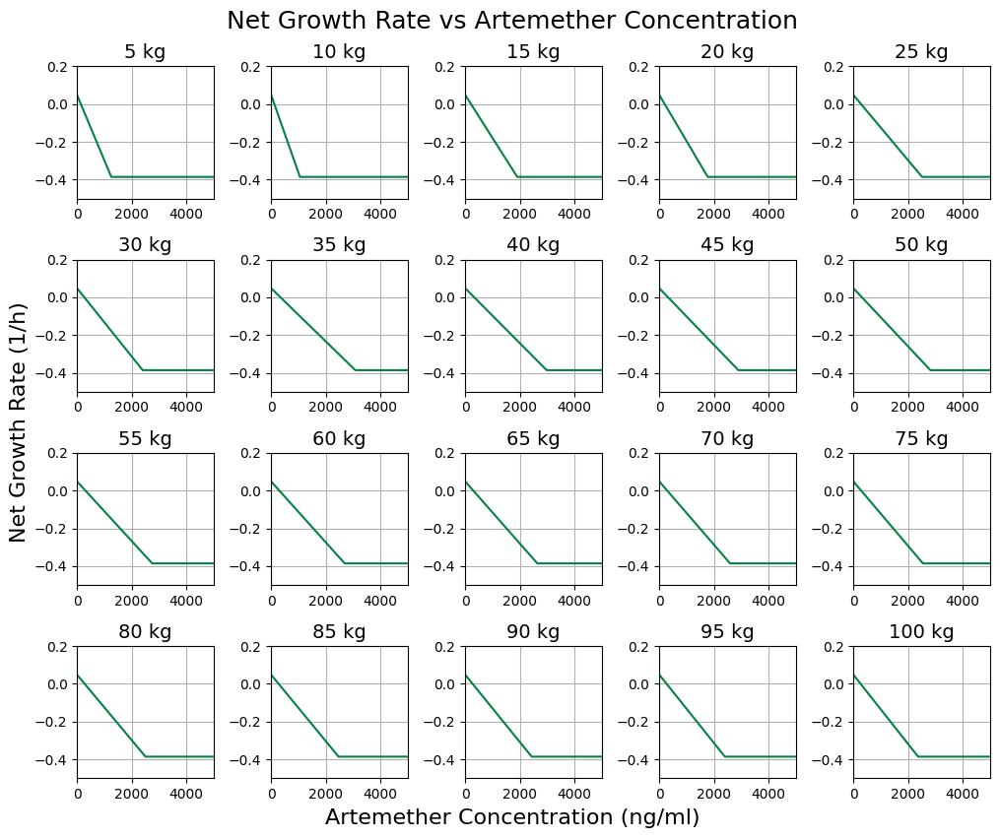

In [814]:
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_concentrations_ng_ml_final[i], effect[i], label=f'Weight: {weight_values[i]} kg', color="#048243")
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=14)
    axs[i // 5, i % 5].set_xlim(0, 0.005*10**6)  # Adjusted for ng/mL
    axs[i // 5, i % 5].set_ylim(-0.5, 0.2)
    axs[i // 5, i % 5].grid()
    #axs[i // 5, i % 5].legend(loc='upper right', bbox_to_anchor=(1.25, 1))
fig.text(0.5, -0.01, 'Artemether Concentration (ng/ml)', ha='center', fontsize=16)
fig.text(-0.01, 0.5, 'Net Growth Rate (1/h)', va='center', rotation='vertical', fontsize=16)
fig.text(0.5, 1.0, 'Net Growth Rate vs Artemether Concentration', ha='center', fontsize=18)
plt.tight_layout()
plt.show()

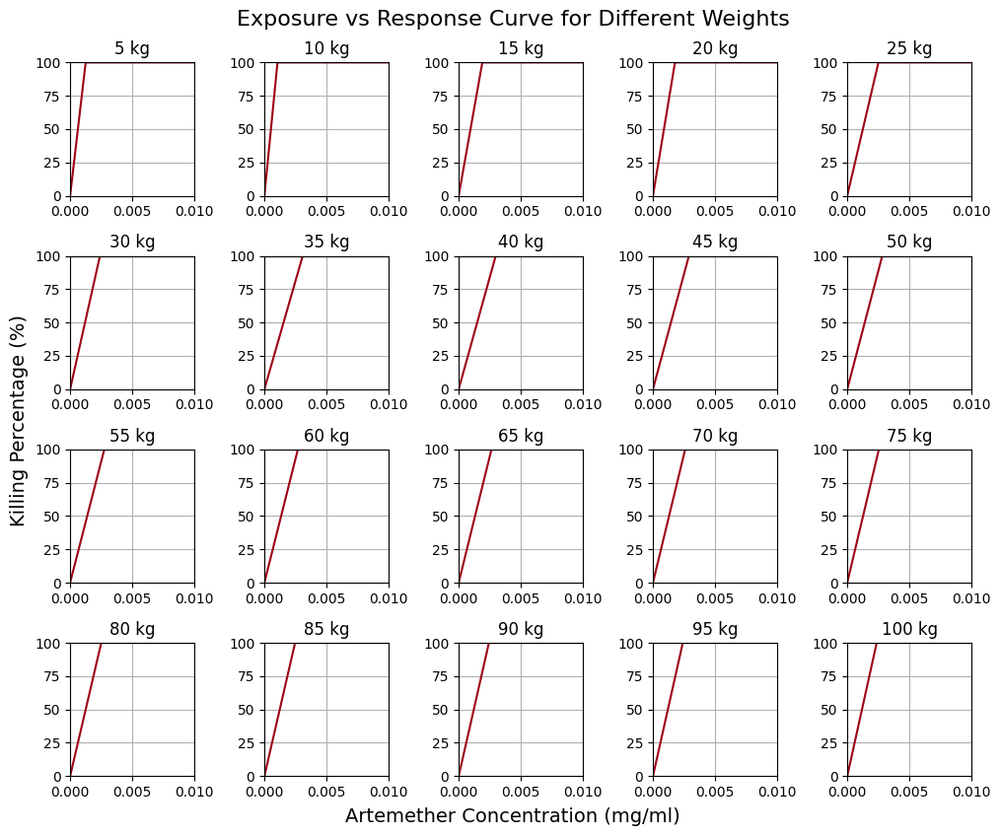

In [806]:
# Creating subplots for each weight for only killing percentage
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_concentrations_mg_ml_final[i], kill_percent[i], label=f'Weight: {weight_values[i]} kg', color='#9d0216')
    # axs[i // 5, i % 5].set_xlabel('Artemether Concentration (ng/ml)')
    # axs[i // 5, i % 5].set_ylabel('Killing Percentage (%)')
    axs[i // 5, i % 5].set_xlim(0, 0.01)  # Adjusted for mg/mL
    axs[i // 5, i % 5].set_ylim(0, 100)
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=12)
    axs[i // 5, i % 5].grid()
#Setting common labels for the entire figure
fig.text(0.5, -0.01, 'Artemether Concentration (mg/ml)', ha='center', fontsize=14)
fig.text(-0.01, 0.5, 'Killing Percentage (%)', va='center', rotation='vertical', fontsize=14)
fig.text(0.5, 1.0, 'Exposure vs Response Curve for Different Weights', ha='center', fontsize=16)
plt.tight_layout()
plt.show()

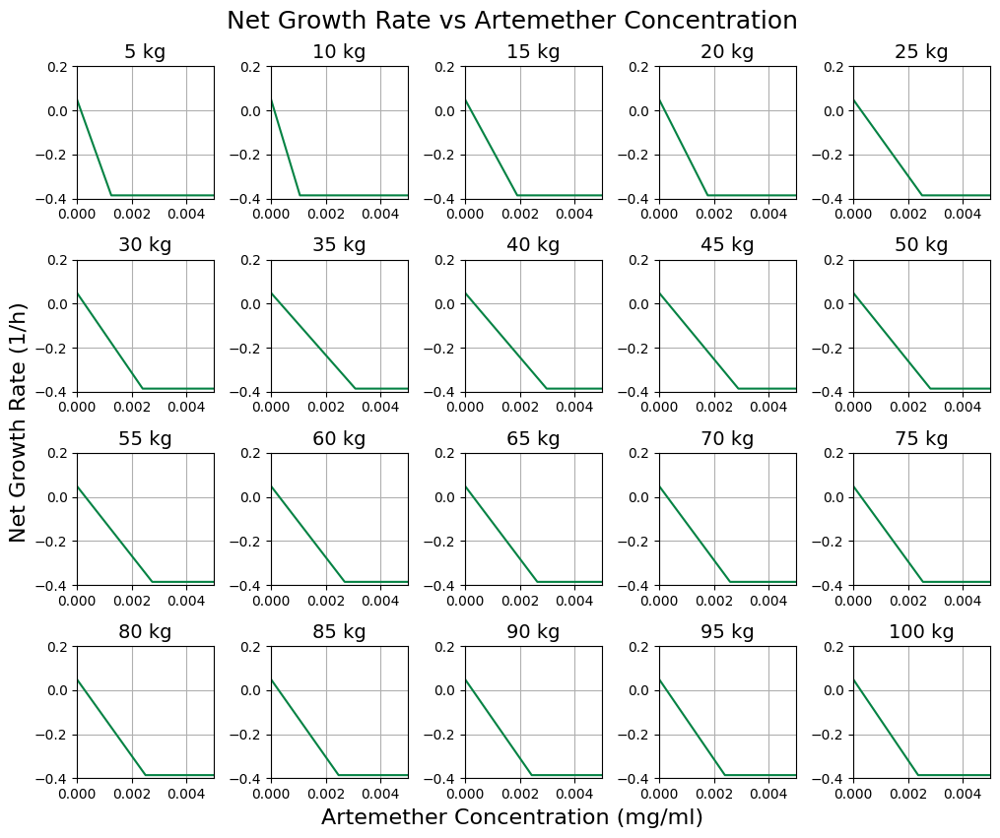

In [821]:
fig, axs = plt.subplots(4, 5, figsize=(10, 8))
for i in range(len(weight_values)):
    axs[i // 5, i % 5].plot(artemether_concentrations_mg_ml_final[i], effect[i], label=f'Weight: {weight_values[i]} kg', color="#048243")
    axs[i // 5, i % 5].set_title(f'{weight_values[i]} kg', fontsize=14)
    axs[i // 5, i % 5].set_xlim(0, 0.005)  # Adjusted for ng/mL
    axs[i // 5, i % 5].set_ylim(-0.4, 0.2)
    axs[i // 5, i % 5].grid()
    #axs[i // 5, i % 5].legend(loc='upper right', bbox_to_anchor=(1.25, 1))
fig.text(0.5, -0.01, 'Artemether Concentration (mg/ml)', ha='center', fontsize=16)
fig.text(-0.01, 0.5, 'Net Growth Rate (1/h)', va='center', rotation='vertical', fontsize=16)
fig.text(0.5, 1.0, 'Net Growth Rate vs Artemether Concentration', ha='center', fontsize=18)
plt.tight_layout()
plt.show()